## Data Scientist Capstone

### By Marwan Saeed Alsharabbi



# COVID-19 Analysis ,visualization & Prediction

<h1 style='background:#27A2AB; border:0; color:black'><center>Introduction</center></h1> 

Coronavirus is a family of viruses that are named after their spiky crown. The novel coronavirus, also known as SARS-CoV-2, is a contagious respiratory virus that first reported in Wuhan, China. On 2/11/2020, the World Health Organization designated the name COVID-19 for the disease caused by the novel coronavirus. This notebook aims at exploring COVID-19 through data analysis and projections.
The world is going through a difficult time and fighting with a deadly virus called COVID-19. Coronavirus disease 2019 (COVID-19) is an infectious disease caused by severe acute respiratory syndrome coronavirus 2 (SARS-CoV-2). It was first identified in December 2019 in Wuhan, China, and has resulted in an ongoing pandemic. The first case may be traced back to 17 November 2019.As of 8 June 2020, more than 7.06 million cases have been reported across 188 countries and territories, resulting in more than 403,000 deaths. More than 3.16 million people have recovered.

## Step 1: Select a real-world dataset 

I chose the Covid 19 data set from the following site(https://ourworldindata.org/coronavirus), and I will analyze the data, clean and perform some interesting processes and conclusions. I will strengthen the analysis and cleaning of global data. 
The data was downloaded from https://covid.ourworldindata.org/data/owid-covid-data.csv.


## Data Sources:

Confirmed cases and deaths: Data comes from the European Centre for Disease Prevention and Control (ECDC)
Testing for COVID-19: Data is collected by the Our World in Data team from official reports; you can find the source information for every country and further details in the post on COVID-19 testing. The testing dataset is updated around twice a week.
Confirmed cases and deaths: Data is collected from a variety of sources (United Nations, World Bank, Global Burden of Disease, etc.)

## License:
The information on this page is summarized from OWID's COVID-19 github page. All of Our World in Data is completely open access and all work is licensed under the Creative Commons BY license. More information about the usage of content can be found OWID github page.https://github.com/owid/covid-19-data/tree/master/public/data

## Authors:
OWID's COVID19 github page the data has been collected, aggregated, and documented by Diana Beltekian, Daniel Gavrilov, Joe Hasell, Bobbie Macdonald, Edouard Mathieu, Esteban Ortiz-Ospina, Hannah Ritchie, Max Roser.

## Step 2: Questions


- How many total population in each location by continents from our dataset
- The 10 top population total in each location by continents from our dataset
- Show countries in Asia, Europe and North America the total_cases and total_deaths,new_cases,total_tests, total_vaccinations by mean, and max
- Let's see the speed of transmission of the Corona virus between countries on the map . 
- Let's see number of total_cases,total_deaths,total_deaths_per_million,test per confirmed(%) on map .
- Top 15 countries for the total_cases,total_deaths,total_deaths_per_million,total_tests ,people_fully_vaccinated and total_vaccinations on plot_hbar and Visulizing Treemaps
- How many the New Deaths Smoothed day by day in continents 
- How many the New Tests Smoothed day by day in continents
- find some gdp_per_capita and new_cases clusters over countries
- find some new_deaths_smoothed_per_million, life_expectancy and hospital_beds_per_thousand clusters over countries
- find some new_deaths_smoothed_per_million, handwashing_facilities and extreme_poverty clusters over countries
- find some new_deaths_smoothed_per_million, life_expectancy and hospital_beds_per_thousand clusters over countries
- Which vaccination scheme is used most?
- Vaccinations (Total vs. Daily) grouped per country and vaccines
- How the vaccination progressed

## Step 3: Problems and Modeling

### 1- Problem Question : 

Created a Linear regression model and fit the model with owid COVID19 data, predicted the world death projection for the next 30 days. In this project I have used sklearn for creating Linear Regression model and created training split with 80 to 20%. The trained the model and predicted the death for next 30 days. Also created model using XGBoost for improving the linear regression model and fit the model with owid COVID19 data, predicted the world death projection for the next 30 days.

### 2- Problem Question:
I will create a model that can predict the risk for the Case Mortality Ratio of a Country utilizing its Life Expectancy, Percentage of Population over 65, and Percentage of diabetes_prevalence and cardiovasc_death_rate ?

It decided on using Population Over Age 65 and Obesity because in the world, over 80% of the deaths were in the population 65 and over, and the CDC has stated that 94% of deaths had some underlying health condition. We also used Life Expectency per country to account for possible deficiencies in the health care system. John Hopkins University has listed several diseases such as heart disease and Diabetes which are known to be exacerbated by Obesity. Our idea is that we can more accurately predict the Mortality Ratio of COVID-19 by using both population 65 and over and Obesity rather than just population 65 and over. This may show that creating a healthier population is the best way to prevent the devastation in future pandemics that the world is currently facing


### Importing Libraries

In [1]:
# os to manipulate files
import os
# Importing pandas to work with DataFrames.
import pandas as pd
# Importing numpy to general methods.
import numpy as np
import time
import datetime
from datetime import datetime, date,timedelta
# Importing the matplotlib to create graphics
import matplotlib 
import matplotlib.pyplot as plt
%matplotlib inline
matplotlib.style.use('ggplot')

# Import seaborn to better the visualization
import seaborn as sns
import plotly.graph_objs as go
from plotly.offline import download_plotlyjs, init_notebook_mode, plot, iplot
import plotly.express as px


# Scipy for statistics
from scipy import stats
from sklearn.metrics import mean_absolute_error,r2_score
from sklearn.model_selection import train_test_split
from sklearn import linear_model
from sklearn.preprocessing import PolynomialFeatures
from sklearn.linear_model import LinearRegression
from scipy import integrate, optimize

# ML libraries
import lightgbm as lgb
import xgboost as xgb
from xgboost import plot_importance, plot_tree
from sklearn.model_selection import RandomizedSearchCV, GridSearchCV
from sklearn import preprocessing, svm
from sklearn import linear_model
from sklearn.metrics import mean_squared_error,explained_variance_score
import sklearn
import matplotlib.dates as dates
import seaborn as seabornInstance 
from sklearn.linear_model import LinearRegression
from sklearn import metrics
from scipy.stats import zscore
from sklearn.preprocessing import StandardScaler
from sklearn.neighbors import KNeighborsClassifier
from sklearn.model_selection import cross_val_score
from matplotlib import rcParams
#sns.set()
#sns.set_context('talk')
import warnings
warnings.filterwarnings('ignore')

### In this link, every execution process pulls the new and updated data from the link

In [2]:
# We'll download this file using the urlretrieve function from the urllib.request module.
from urllib.request import urlretrieve

urlretrieve('https://covid.ourworldindata.org/data/owid-covid-data.csv','owid-covid-data.csv')

('owid-covid-data.csv', <http.client.HTTPMessage at 0x205adf36f10>)

In [3]:
#Read data from a CSV file into a Pandas DataFrame object
world_covid19_df = pd.read_csv('owid-covid-data.csv')

In [4]:
owidcovidcodebook=pd.read_csv('https://raw.githubusercontent.com/owid/covid-19-data/master/public/data/owid-covid-codebook.csv',index_col=0)

In [5]:
owidcovidcodebook

,source,description
column,,
iso_code,International Organization for Standardization,ISO 3166-1 alpha-3 – three-letter country codes
continent,Our World in Data,Continent of the geographical location
location,Our World in Data,Geographical location
date,Our World in Data,Date of observation
total_cases,COVID-19 Data Repository by the Center for Sys...,Total confirmed cases of COVID-19
new_cases,COVID-19 Data Repository by the Center for Sys...,New confirmed cases of COVID-19
new_cases_smoothed,COVID-19 Data Repository by the Center for Sys...,New confirmed cases of COVID-19 (7-day smoothed)
total_deaths,COVID-19 Data Repository by the Center for Sys...,Total deaths attributed to COVID-19
new_deaths,COVID-19 Data Repository by the Center for Sys...,New deaths attributed to COVID-19


In [6]:
world_covid19_df

,iso_code,continent,location,date,total_cases,new_cases,new_cases_smoothed,total_deaths,new_deaths,new_deaths_smoothed,...,gdp_per_capita,extreme_poverty,cardiovasc_death_rate,diabetes_prevalence,female_smokers,male_smokers,handwashing_facilities,hospital_beds_per_thousand,life_expectancy,human_development_index
0,AFG,Asia,Afghanistan,2020-02-24,1.0,1.0,NaN,NaN,NaN,NaN,...,1803.987,NaN,597.029,9.59,NaN,NaN,37.746,0.5,64.83,0.511
1,AFG,Asia,Afghanistan,2020-02-25,1.0,0.0,NaN,NaN,NaN,NaN,...,1803.987,NaN,597.029,9.59,NaN,NaN,37.746,0.5,64.83,0.511
2,AFG,Asia,Afghanistan,2020-02-26,1.0,0.0,NaN,NaN,NaN,NaN,...,1803.987,NaN,597.029,9.59,NaN,NaN,37.746,0.5,64.83,0.511
3,AFG,Asia,Afghanistan,2020-02-27,1.0,0.0,NaN,NaN,NaN,NaN,...,1803.987,NaN,597.029,9.59,NaN,NaN,37.746,0.5,64.83,0.511
4,AFG,Asia,Afghanistan,2020-02-28,1.0,0.0,NaN,NaN,NaN,NaN,...,1803.987,NaN,597.029,9.59,NaN,NaN,37.746,0.5,64.83,0.511
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
76210,ZWE,Africa,Zimbabwe,2021-03-16,36535.0,31.0,30.571,1507.0,3.0,2.571,...,1899.775,21.4,307.846,1.82,1.6,30.7,36.791,1.7,61.49,0.571
76211,ZWE,Africa,Zimbabwe,2021-03-17,36552.0,17.0,30.143,1508.0,1.0,2.714,...,1899.775,21.4,307.846,1.82,1.6,30.7,36.791,1.7,61.49,0.571
76212,ZWE,Africa,Zimbabwe,2021-03-18,36611.0,59.0,33.429,1509.0,1.0,2.429,...,1899.775,21.4,307.846,1.82,1.6,30.7,36.791,1.7,61.49,0.571
76213,ZWE,Africa,Zimbabwe,2021-03-19,36652.0,41.0,32.714,1510.0,1.0,2.000,...,1899.775,21.4,307.846,1.82,1.6,30.7,36.791,1.7,61.49,0.571


Data from the file is read and stored in a DataFrame object - one of the core data structures in Pandas for storing and working with tabular data. We typically use the _df suffix in the variable names for dataframes.

In [7]:
type(world_covid19_df)

pandas.core.frame.DataFrame

In [8]:
#Get the number of rows & columns as a tuple
world_covid19_df.shape

(76215, 59)

In [9]:
#View basic infomation about rows, columns & data types
world_covid19_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 76215 entries, 0 to 76214
Data columns (total 59 columns):
 #   Column                                 Non-Null Count  Dtype  
---  ------                                 --------------  -----  
 0   iso_code                               76215 non-null  object 
 1   continent                              72473 non-null  object 
 2   location                               76215 non-null  object 
 3   date                                   76215 non-null  object 
 4   total_cases                            74913 non-null  float64
 5   new_cases                              74911 non-null  float64
 6   new_cases_smoothed                     73910 non-null  float64
 7   total_deaths                           65624 non-null  float64
 8   new_deaths                             65782 non-null  float64
 9   new_deaths_smoothed                    73910 non-null  float64
 10  total_cases_per_million                74505 non-null  float64
 11  ne

## Step 2: Perform data preparation & Cleaning

For now, let's assume this was indeed a data entry error. We can use one of the following approaches for dealing with the missing or faulty value:

- Replace it with 0.
- Replace it with the average of the entire column
- Replace it with the average of the values on the previous & next date
- Discard the row entirely
Which approach you pick requires some context about the data and the problem. In this case, since we are dealing with data ordered by date, we can go ahead with the one approach

It is not really logical to delete Nan values but replace with 0, because that would confirm that the result was static because the data is historical and adopts high time series, we cannot replace or delete even the most data in the rows because it is data historical 

### Numerical Features
I'd rather copy from the list than from Pandas Profiling

In [10]:
# ets first handle numerical features with nan value
Numerical_feat = [feature for feature in world_covid19_df.columns if world_covid19_df[feature].dtypes != 'O']
print('Total numerical features: ', len(Numerical_feat))
print('\nNumerical Features: ', Numerical_feat)

Total numerical features:  54

Numerical Features:  ['total_cases', 'new_cases', 'new_cases_smoothed', 'total_deaths', 'new_deaths', 'new_deaths_smoothed', 'total_cases_per_million', 'new_cases_per_million', 'new_cases_smoothed_per_million', 'total_deaths_per_million', 'new_deaths_per_million', 'new_deaths_smoothed_per_million', 'reproduction_rate', 'icu_patients', 'icu_patients_per_million', 'hosp_patients', 'hosp_patients_per_million', 'weekly_icu_admissions', 'weekly_icu_admissions_per_million', 'weekly_hosp_admissions', 'weekly_hosp_admissions_per_million', 'new_tests', 'total_tests', 'total_tests_per_thousand', 'new_tests_per_thousand', 'new_tests_smoothed', 'new_tests_smoothed_per_thousand', 'positive_rate', 'tests_per_case', 'total_vaccinations', 'people_vaccinated', 'people_fully_vaccinated', 'new_vaccinations', 'new_vaccinations_smoothed', 'total_vaccinations_per_hundred', 'people_vaccinated_per_hundred', 'people_fully_vaccinated_per_hundred', 'new_vaccinations_smoothed_per_mi

### Categorical Features

In [11]:
# categorical features
categorical_feat = [feature for feature in world_covid19_df.columns if world_covid19_df[feature].dtypes=='O']
print('Total categorical features: ', len(categorical_feat))
print('\n',categorical_feat)

Total categorical features:  5

 ['iso_code', 'continent', 'location', 'date', 'tests_units']


In [12]:
## Replacing the numerical Missing Values
for feature in Numerical_feat:
    ## We will replace by using median since there are outliers
        world_covid19_df[feature].fillna(0,inplace=True)
    
world_covid19_df[Numerical_feat].isnull().sum()

total_cases                              0
new_cases                                0
new_cases_smoothed                       0
total_deaths                             0
new_deaths                               0
new_deaths_smoothed                      0
total_cases_per_million                  0
new_cases_per_million                    0
new_cases_smoothed_per_million           0
total_deaths_per_million                 0
new_deaths_per_million                   0
new_deaths_smoothed_per_million          0
reproduction_rate                        0
icu_patients                             0
icu_patients_per_million                 0
hosp_patients                            0
hosp_patients_per_million                0
weekly_icu_admissions                    0
weekly_icu_admissions_per_million        0
weekly_hosp_admissions                   0
weekly_hosp_admissions_per_million       0
new_tests                                0
total_tests                              0
total_tests

In [13]:
world_covid19_df

,iso_code,continent,location,date,total_cases,new_cases,new_cases_smoothed,total_deaths,new_deaths,new_deaths_smoothed,...,gdp_per_capita,extreme_poverty,cardiovasc_death_rate,diabetes_prevalence,female_smokers,male_smokers,handwashing_facilities,hospital_beds_per_thousand,life_expectancy,human_development_index
0,AFG,Asia,Afghanistan,2020-02-24,1.0,1.0,0.000,0.0,0.0,0.000,...,1803.987,0.0,597.029,9.59,0.0,0.0,37.746,0.5,64.83,0.511
1,AFG,Asia,Afghanistan,2020-02-25,1.0,0.0,0.000,0.0,0.0,0.000,...,1803.987,0.0,597.029,9.59,0.0,0.0,37.746,0.5,64.83,0.511
2,AFG,Asia,Afghanistan,2020-02-26,1.0,0.0,0.000,0.0,0.0,0.000,...,1803.987,0.0,597.029,9.59,0.0,0.0,37.746,0.5,64.83,0.511
3,AFG,Asia,Afghanistan,2020-02-27,1.0,0.0,0.000,0.0,0.0,0.000,...,1803.987,0.0,597.029,9.59,0.0,0.0,37.746,0.5,64.83,0.511
4,AFG,Asia,Afghanistan,2020-02-28,1.0,0.0,0.000,0.0,0.0,0.000,...,1803.987,0.0,597.029,9.59,0.0,0.0,37.746,0.5,64.83,0.511
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
76210,ZWE,Africa,Zimbabwe,2021-03-16,36535.0,31.0,30.571,1507.0,3.0,2.571,...,1899.775,21.4,307.846,1.82,1.6,30.7,36.791,1.7,61.49,0.571
76211,ZWE,Africa,Zimbabwe,2021-03-17,36552.0,17.0,30.143,1508.0,1.0,2.714,...,1899.775,21.4,307.846,1.82,1.6,30.7,36.791,1.7,61.49,0.571
76212,ZWE,Africa,Zimbabwe,2021-03-18,36611.0,59.0,33.429,1509.0,1.0,2.429,...,1899.775,21.4,307.846,1.82,1.6,30.7,36.791,1.7,61.49,0.571
76213,ZWE,Africa,Zimbabwe,2021-03-19,36652.0,41.0,32.714,1510.0,1.0,2.000,...,1899.775,21.4,307.846,1.82,1.6,30.7,36.791,1.7,61.49,0.571


In [14]:
#Store the clean DataFrame in a CSV file
world_covid19_df.to_csv('covid19_df_master.csv',index=False)

<a id="1"></a><h1 style='background:#26A2AB; border:0; color:black'><center>Analysis preparation</center></h1>

## Step 3: Perform exploratory Analysis & Visualization


### Loading the cleaned Data and Exploring the histogram of the data looks like

In [15]:
covid_df=pd.read_csv('covid19_df_master.csv')
#covid_df.hist(figsize=(15,15));

It appears that each column contains values of a specific data type. For the numeric columns, you can view the some statistical information like mean, standard deviation, minimum/maximum values and number of non-empty values using the .describe method

#### It appears that each column contains values of a specific data type. You can view statistical information for numerical columns (mean, standard deviation, minimum/maximum values, and the number of non-empty values) using the .describe method.

In [16]:
covid_df.describe().style.background_gradient(cmap="CMRmap_r")

,total_cases,new_cases,new_cases_smoothed,total_deaths,new_deaths,new_deaths_smoothed,total_cases_per_million,new_cases_per_million,new_cases_smoothed_per_million,total_deaths_per_million,new_deaths_per_million,new_deaths_smoothed_per_million,reproduction_rate,icu_patients,icu_patients_per_million,hosp_patients,hosp_patients_per_million,weekly_icu_admissions,weekly_icu_admissions_per_million,weekly_hosp_admissions,weekly_hosp_admissions_per_million,new_tests,total_tests,total_tests_per_thousand,new_tests_per_thousand,new_tests_smoothed,new_tests_smoothed_per_thousand,positive_rate,tests_per_case,total_vaccinations,people_vaccinated,people_fully_vaccinated,new_vaccinations,new_vaccinations_smoothed,total_vaccinations_per_hundred,people_vaccinated_per_hundred,people_fully_vaccinated_per_hundred,new_vaccinations_smoothed_per_million,stringency_index,population,population_density,median_age,aged_65_older,aged_70_older,gdp_per_capita,extreme_poverty,cardiovasc_death_rate,diabetes_prevalence,female_smokers,male_smokers,handwashing_facilities,hospital_beds_per_thousand,life_expectancy,human_development_index
count,76215.000000,76215.000000,76215.000000,76215.000000,76215.000000,76215.000000,76215.000000,76215.000000,76215.000000,76215.000000,76215.000000,76215.000000,76215.000000,76215.000000,76215.000000,76215.000000,76215.000000,76215.000000,76215.000000,76215.000000,76215.000000,76215.000000,76215.000000,76215.000000,76215.000000,76215.000000,76215.000000,76215.000000,76215.000000,76215.000000,76215.000000,76215.000000,76215.000000,76215.000000,76215.000000,76215.000000,76215.000000,76215.000000,76215.000000,76215.000000,76215.000000,76215.000000,76215.000000,76215.000000,76215.000000,76215.000000,76215.000000,76215.000000,76215.000000,76215.000000,76215.000000,76215.000000,76215.000000,76215.000000
mean,664429.456551,5129.566568,5063.112630,17076.098655,114.393531,113.178646,7873.626153,66.505456,65.390387,160.782550,1.209663,1.194381,0.817522,104.170898,2.427559,581.768497,19.617366,2.352516,0.175219,60.790989,1.757699,17638.245293,2187700.430243,80.015992,0.720085,19339.450148,0.782154,0.044136,80.619000,503611.229863,314467.331864,100983.102303,16332.660697,16596.512301,0.524075,0.339373,0.126228,243.715712,50.208742,129789029.585436,312.872929,27.700474,7.880594,5.023743,17411.789829,8.249080,236.141847,7.253194,7.601972,23.205725,23.489918,2.548185,69.505214,0.667534
std,4698196.905872,32191.869926,31633.387699,108136.089442,674.709265,652.256822,15662.046239,168.372816,141.179154,315.421600,3.623517,2.756024,0.509057,1038.799768,10.996649,4734.364944,85.827497,57.094248,3.765821,1554.711563,32.119539,102929.078224,15326886.721775,265.393666,3.099126,100759.298246,2.652978,0.082895,624.528191,7953373.735704,4766946.098613,1766444.270360,256803.603832,218893.084722,4.590345,2.888190,1.552936,1490.438593,29.046831,694541376.973729,1579.306203,12.419133,6.482936,4.370634,19609.485356,16.968226,133.738715,4.294111,10.021965,18.657876,33.329193,2.519296,17.534691,0.246698
min,0.000000,-74347.000000,-6223.000000,0.000000,-1918.000000,-232.143000,0.000000,-2153.437000,-276.825000,0.000000,-76.445000,-10.921000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,-239172.000000,0.000000,0.000000,-23.010000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,673.500000,1.000000,4.429000,10.000000,0.000000,0.000000,123.578000,0.061000,0.741000,1.603000,0.000000,0.000000,0.520000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,30.560000,2540916.000000,24.282000,19.600000,3.008000,1.783000,2896.913000,0.000000,140.448000,4.610

## Business Questions


- How many total population in each location by continents from our dataset
- The 10 top population total in each location by continents from our dataset
- Show countries in Asia, Europe and North America the total_cases and total_deaths,new_cases,total_tests, total_vaccinations by mean, and max
- Let's see the speed of transmission of the Corona virus between countries on the map . 
- Let's see number of total_cases,total_deaths,total_deaths_per_million,test per confirmed(%) on map .
- Top 15 countries for the total_cases,total_deaths,total_deaths_per_million,total_tests ,people_fully_vaccinated and total_vaccinations on plot_hbar and Visulizing Treemaps
- How many the New Deaths Smoothed day by day in continents 
- How many the New Tests Smoothed day by day in continents
- find some gdp_per_capita and new_cases clusters over countries
- find some new_deaths_smoothed_per_million, life_expectancy and hospital_beds_per_thousand clusters over countries
- find some new_deaths_smoothed_per_million, handwashing_facilities and extreme_poverty clusters over countries
- find some new_deaths_smoothed_per_million, life_expectancy and hospital_beds_per_thousand clusters over countries
- Which vaccination scheme is used most?
- Vaccinations (Total vs. Daily) grouped per country and vaccines
- How the vaccination progressed

# Data Understanding

While we ahve looked at overall numbers for the cases, tests, positive rate etc., it would be also be useful to study these numbers on a month-by-month basis. The date column might come in handy here, as Pandas provides many utilities for working with dates.

In [17]:
#covid_df['date'] = pd.to_datetime(covid_df.date)

You can see that it now has the datatype datetime64. We can now extract different parts of the data into separate columns, using the DatetimeIndex class 

In [18]:
#covid_df['year'] = pd.DatetimeIndex(covid_df.date).year
#covid_df['month'] = pd.DatetimeIndex(covid_df.date).month
#covid_df['day'] = pd.DatetimeIndex(covid_df.date).day
#covid_df['weekday'] = pd.DatetimeIndex(covid_df.date).weekday

In [19]:
covid_df.head(10)

,iso_code,continent,location,date,total_cases,new_cases,new_cases_smoothed,total_deaths,new_deaths,new_deaths_smoothed,...,gdp_per_capita,extreme_poverty,cardiovasc_death_rate,diabetes_prevalence,female_smokers,male_smokers,handwashing_facilities,hospital_beds_per_thousand,life_expectancy,human_development_index
0,AFG,Asia,Afghanistan,2020-02-24,1.0,1.0,0.000,0.0,0.0,0.0,...,1803.987,0.0,597.029,9.59,0.0,0.0,37.746,0.5,64.83,0.511
1,AFG,Asia,Afghanistan,2020-02-25,1.0,0.0,0.000,0.0,0.0,0.0,...,1803.987,0.0,597.029,9.59,0.0,0.0,37.746,0.5,64.83,0.511
2,AFG,Asia,Afghanistan,2020-02-26,1.0,0.0,0.000,0.0,0.0,0.0,...,1803.987,0.0,597.029,9.59,0.0,0.0,37.746,0.5,64.83,0.511
3,AFG,Asia,Afghanistan,2020-02-27,1.0,0.0,0.000,0.0,0.0,0.0,...,1803.987,0.0,597.029,9.59,0.0,0.0,37.746,0.5,64.83,0.511
4,AFG,Asia,Afghanistan,2020-02-28,1.0,0.0,0.000,0.0,0.0,0.0,...,1803.987,0.0,597.029,9.59,0.0,0.0,37.746,0.5,64.83,0.511
5,AFG,Asia,Afghanistan,2020-02-29,1.0,0.0,0.143,0.0,0.0,0.0,...,1803.987,0.0,597.029,9.59,0.0,0.0,37.746,0.5,64.83,0.511
6,AFG,Asia,Afghanistan,2020-03-01,1.0,0.0,0.143,0.0,0.0,0.0,...,1803.987,0.0,597.029,9.59,0.0,0.0,37.746,0.5,64.83,0.511
7,AFG,Asia,Afghanistan,2020-03-02,1.0,0.0,0.000,0.0,0.0,0.0,...,1803.987,0.0,597.029,9.59,0.0,0.0,37.746,0.5,64.83,0.511
8,AFG,Asia,Afghanistan,2020-03-03,2.0,1.0,0.143,0.0,0.0,0.0,...,1803.987,0.0,597.029,9.59,0.0,0.0,37.746,0.5,64.83,0.511
9,AFG,Asia,Afghanistan,2020-03-04,4.0,2.0,0.429,0.0,0.0,0.0,...,1803.987,0.0,597.029,9.59,0.0,0.0,37.746,0.5,64.83,0.511


In [20]:
sum(covid_df.duplicated())

0

In [21]:
covid_df.isnull().sum()

iso_code                                     0
continent                                 3742
location                                     0
date                                         0
total_cases                                  0
new_cases                                    0
new_cases_smoothed                           0
total_deaths                                 0
new_deaths                                   0
new_deaths_smoothed                          0
total_cases_per_million                      0
new_cases_per_million                        0
new_cases_smoothed_per_million               0
total_deaths_per_million                     0
new_deaths_per_million                       0
new_deaths_smoothed_per_million              0
reproduction_rate                            0
icu_patients                                 0
icu_patients_per_million                     0
hosp_patients                                0
hosp_patients_per_million                    0
weekly_icu_ad

In [22]:
covid_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 76215 entries, 0 to 76214
Data columns (total 59 columns):
 #   Column                                 Non-Null Count  Dtype  
---  ------                                 --------------  -----  
 0   iso_code                               76215 non-null  object 
 1   continent                              72473 non-null  object 
 2   location                               76215 non-null  object 
 3   date                                   76215 non-null  object 
 4   total_cases                            76215 non-null  float64
 5   new_cases                              76215 non-null  float64
 6   new_cases_smoothed                     76215 non-null  float64
 7   total_deaths                           76215 non-null  float64
 8   new_deaths                             76215 non-null  float64
 9   new_deaths_smoothed                    76215 non-null  float64
 10  total_cases_per_million                76215 non-null  float64
 11  ne

In [23]:
covid_df.describe().T.style.background_gradient(cmap="CMRmap_r")

,count,mean,std,min,25%,50%,75%,max
total_cases,76215.000000,664429.456551,4698196.905872,0.000000,673.500000,7821.000000,87043.000000,122813796.000000
new_cases,76215.000000,5129.566568,32191.869926,-74347.000000,1.000000,55.000000,662.000000,880902.000000
new_cases_smoothed,76215.000000,5063.112630,31633.387699,-6223.000000,4.429000,63.000000,666.785500,739564.429000
total_deaths,76215.000000,17076.098655,108136.089442,0.000000,10.000000,130.000000,1710.000000,2709639.000000
new_deaths,76215.000000,114.393531,674.709265,-1918.000000,0.000000,1.000000,11.000000,17895.000000
new_deaths_smoothed,76215.000000,113.178646,652.256822,-232.143000,0.000000,0.857000,11.571000,14424.000000
total_cases_per_million,76215.000000,7873.626153,15662.046239,0.000000,123.578000,1036.897000,7189.766500,148592.506000
new_cases_per_million,76215.000000,66.505456,168.372816,-2153.437000,0.061000,5.861000,55.940000,8652.658000
new_cases_smoothed_per_million,76215.000000,65.390387,141.179154,-276.825000,0.741000,7.536000,61.936000,2648.773000
total_deaths_per_million,76215.000000,160.782550,315.421600,0.000000,1.603000,19.611000,139.170000,2327.774000


### Question#1 

### How the many  total population in each location  by continents  from our datase

### Question#1 

### How the many  total population in each location  by continents  from our datase

In [24]:
data_popu=covid_df.groupby('continent').sum()

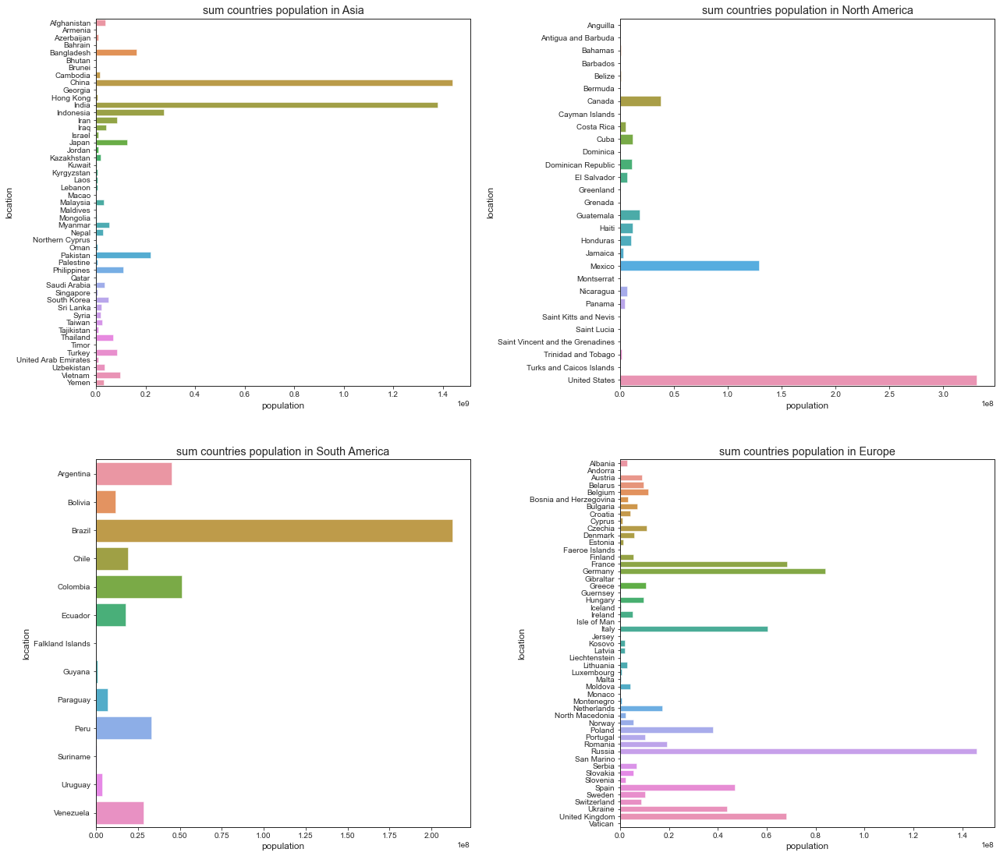

In [25]:
plt.figure(figsize = (20,18)) 
sns.set_style('ticks')
#sum countries population in Asia
plt.subplot(221)
sns.barplot(y='location', x='population', data=covid_df[covid_df['continent'] == 'Asia']).set_title('sum countries population in Asia')

#sum countries population in North America
plt.subplot(222)
sns.barplot(y='location', x='population', data=covid_df[covid_df['continent'] == 'North America']).set_title('sum countries population in North America')

#sum countries population in South America
plt.subplot(223)
sns.barplot(y='location', x='population',data=covid_df[covid_df['continent'] == 'South America']).set_title('sum countries population in South America')

#sum countries population in Europe
plt.subplot(224)
sns.set_style('ticks')
sns.barplot(y='location', x='population', data=covid_df[covid_df['continent'] == 'Europe']).set_title('sum countries population in Europe')
plt.subplots_adjust(left=0.1, 
                    bottom=0.1,  
                    right=0.9,  
                    top=0.9,  
                    wspace=0.4,  
                    hspace=0.2) 
plt.show();

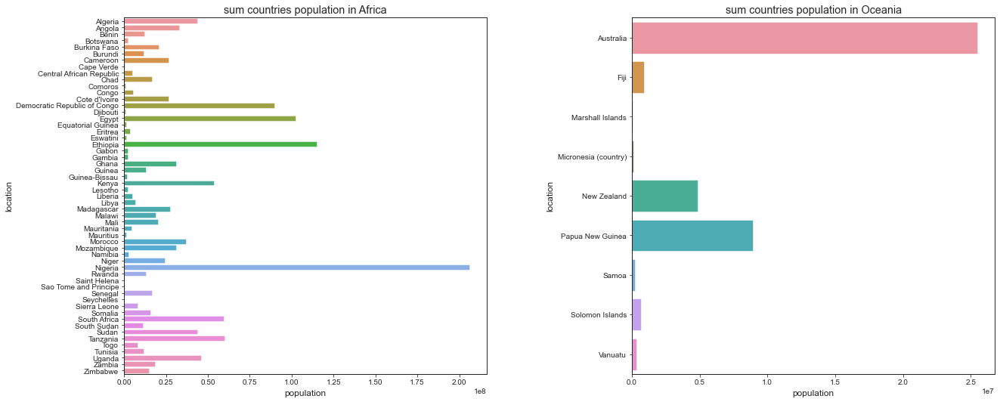

In [26]:
#sum countries population in Africa
plt.figure(figsize = (20,18))
plt.subplot(221)
sns.set_style('ticks')
#sns.set(rc={'figure.figsize':(11.7,8.27)})
sns.barplot(y='location', x='population', data=covid_df[covid_df['continent'] == 'Africa']).set_title('sum countries population in Africa')
#sum countries population in Oceania
plt.subplot(222)
sns.barplot(y='location', x='population', data=covid_df[covid_df['continent'] == 'Oceania']).set_title('sum countries population in Oceania')
plt.subplots_adjust(left=0.1, 
                    bottom=0.1,  
                    right=0.9,  
                    top=0.9,  
                    wspace=0.4,  
                    hspace=0.2) 
plt.show();

### Question#2

### The 10 top  population total in each location by continents  from  our dataset 

In [27]:
#top countries total population in asia
top_popu_asia=covid_df[covid_df['continent'] == 'Asia']
print("The top 10 countries total population in the continent of Asia is :\n",top_popu_asia.groupby(['continent','location'])['population'].max().nlargest(10))

The top 10 countries total population in the continent of Asia is :
 continent  location   
Asia       China          1.439324e+09
           India          1.380004e+09
           Indonesia      2.735236e+08
           Pakistan       2.208923e+08
           Bangladesh     1.646894e+08
           Japan          1.264765e+08
           Philippines    1.095811e+08
           Vietnam        9.733858e+07
           Turkey         8.433907e+07
           Iran           8.399295e+07
Name: population, dtype: float64


In [28]:
#top countries total population in North America
top_popu_north_america=covid_df[covid_df['continent'] == 'North America']
print("The top 10 countries total population in the continent of North America is :\n",top_popu_north_america.groupby(['continent','location'])['population'].max().nlargest(10))

The top 10 countries total population in the continent of North America is :
 continent      location          
North America  United States         331002647.0
               Mexico                128932753.0
               Canada                 37742157.0
               Guatemala              17915567.0
               Haiti                  11402533.0
               Cuba                   11326616.0
               Dominican Republic     10847904.0
               Honduras                9904608.0
               Nicaragua               6624554.0
               El Salvador             6486201.0
Name: population, dtype: float64


In [29]:
#top countries total population in South America
top_popu_south_america=covid_df[covid_df['continent'] == 'South America']
print("The top 10 countries total population in the continent of South America is :\n",top_popu_south_america.groupby(['continent','location'])['population'].max().nlargest(10))

The top 10 countries total population in the continent of South America is :
 continent      location 
South America  Brazil       212559409.0
               Colombia      50882884.0
               Argentina     45195777.0
               Peru          32971846.0
               Venezuela     28435943.0
               Chile         19116209.0
               Ecuador       17643060.0
               Bolivia       11673029.0
               Paraguay       7132530.0
               Uruguay        3473727.0
Name: population, dtype: float64


In [30]:
#top countries total population in Europe
top_popu_europe=covid_df[covid_df['continent'] == 'Europe']
print("The top 10 countries total population in the continent of Europe is :\n",top_popu_europe.groupby(['continent','location'])['population'].max().nlargest(10))

The top 10 countries total population in the continent of Europe is :
 continent  location      
Europe     Russia            145934460.0
           Germany            83783945.0
           France             68147687.0
           United Kingdom     67886004.0
           Italy              60461828.0
           Spain              46754783.0
           Ukraine            43733759.0
           Poland             37846605.0
           Romania            19237682.0
           Netherlands        17134873.0
Name: population, dtype: float64


In [31]:
##Show two or more countries total population numbers the min
data=covid_df[covid_df['continent'] == 'Europe']
data.groupby(['continent','location'])['population'].min().nsmallest(10)

continent  location      
Europe     Vatican              809.0
           Gibraltar          33691.0
           San Marino         33938.0
           Liechtenstein      38137.0
           Monaco             39244.0
           Faeroe Islands     48865.0
           Guernsey           67052.0
           Andorra            77265.0
           Isle of Man        85032.0
           Jersey            101073.0
Name: population, dtype: float64

#### The 10 top population total in each location by continent 'Africa from our dataset

In [32]:
#top countries total population in Europe
top_popu_africa=covid_df[covid_df['continent'] == 'Africa']
print(" The top 10 countries total population in the continent of Africa is :\n",top_popu_africa.groupby(['continent','location'])['population'].max().nlargest(10))

 The top 10 countries total population in the continent of Africa is :
 continent  location                    
Africa     Nigeria                         206139587.0
           Ethiopia                        114963583.0
           Egypt                           102334403.0
           Democratic Republic of Congo     89561404.0
           Tanzania                         59734213.0
           South Africa                     59308690.0
           Kenya                            53771300.0
           Uganda                           45741000.0
           Algeria                          43851043.0
           Sudan                            43849269.0
Name: population, dtype: float64


In [33]:
#top 10 countries total population in Oceania
top_popu_oceania=covid_df[covid_df['continent'] == 'Oceania']
print(" The top 10 countries total population in the continent of Oceania is :\n",top_popu_oceania.groupby(['continent','location'])['population'].max().nlargest(10))

 The top 10 countries total population in the continent of Oceania is :
 continent  location            
Oceania    Australia               25499881.0
           Papua New Guinea         8947027.0
           New Zealand              4822233.0
           Fiji                      896444.0
           Solomon Islands           686878.0
           Vanuatu                   307150.0
           Samoa                     198410.0
           Micronesia (country)      115021.0
           Marshall Islands           59194.0
Name: population, dtype: float64


#### Create a data frame showing the total population of each continent

In [34]:
continent_populations_df = covid_df.groupby(['continent'])['population'].sum()
continent_populations_df

continent
Africa           5.072744e+11
Asia             1.890449e+12
Europe           3.055237e+11
North America    2.476494e+11
Oceania          1.641354e+10
South America    1.701631e+11
Name: population, dtype: float64

### Question#3
### Show countries in  Asia,Europe and North America the  total_cases and total_deaths,new_cases,total_tests, total_vaccinations by mean, and max

In [35]:
#Show countries in  asia the  total_cases and total_deaths,new_cases,total_tests, numbers mean, and max
data_total=covid_df[covid_df['continent'] == 'Asia']
data_total.groupby(['continent','location']).agg({'total_cases': ['mean','max'],'total_deaths':['mean','max'],'total_tests':['mean','max'],'total_vaccinations':['mean','max']}).style.background_gradient(cmap="CMRmap_r")


In [36]:
#Show countries in  Europe the  total_cases and total_deaths,new_cases,total_tests, numbers mean, and max
data_total=covid_df[covid_df['continent'] == 'Europe']
data_total.groupby(['continent','location']).agg({'total_cases': ['mean','max'],'total_deaths':['mean','max'],'total_tests':['mean','max'],'total_vaccinations':['mean','max']}).style.background_gradient(cmap="CMRmap_r")



In [37]:
#Show countries in  Europe the  total_cases and total_deaths,new_cases,total_tests, numbers mean, and max
data_total=covid_df[covid_df['continent'] == 'North America']
data_total.groupby(['continent','location']).agg({'total_cases': ['mean','max'],'total_deaths':['mean','max'],'total_tests':['mean','max'],'total_vaccinations':['mean','max']}).style.background_gradient(cmap="CMRmap_r")



### Question#4
### Let's see the speed of transmission of the Corona virus between countries on the map . 

## Worldwide spread

Coronavirus is continuing its spread across the world with almost 100 million confirmed cases in 191 countries and more than two million deaths. and the virus has been detected in nearly every country, as these maps show.

#### We can see trend covid-19 moving to China -> Europe -> US

In [38]:
worldwide_spread=covid_df[["continent","location","total_cases","total_tests","date","total_deaths","positive_rate","total_vaccinations","people_fully_vaccinated"]]

df=worldwide_spread.dropna(axis=0)
df.sort_values("total_tests",ascending=False)
df_loc=df.groupby(['location']).max()
df_loc.drop(["date"],axis=1,inplace=True)
df_loc
for i,r in df_loc.iterrows():
    if r["total_tests"]>0:
        df_loc.loc[i,"test per confirmed(%)"]=(r["total_cases"]/r["total_tests"])*100
df_covid=df_loc.reset_index()  
df_covid.style.background_gradient(cmap="CMRmap_r")


,location,continent,total_cases,total_tests,total_deaths,positive_rate,total_vaccinations,people_fully_vaccinated,test per confirmed(%)
0,Afghanistan,Asia,56093.000000,0.000000,2462.000000,0.000000,54000.000000,0.000000,nan
1,Albania,Europe,120541.000000,497742.000000,2133.000000,0.409000,33369.000000,655.000000,24.217567
2,Algeria,Africa,116066.000000,0.000000,3055.000000,0.000000,75000.000000,0.000000,nan
3,Andorra,Europe,11481.000000,162071.000000,113.000000,0.157000,4914.000000,1264.000000,7.083932
4,Angola,Africa,21696.000000,0.000000,526.000000,0.000000,49000.000000,0.000000,nan
5,Anguilla,North America,0.000000,0.000000,0.000000,0.000000,5348.000000,0.000000,nan
6,Antigua and Barbuda,North America,1033.000000,0.000000,28.000000,0.000000,25677.000000,0.000000,nan
7,Argentina,South America,2241739.000000,6838489.000000,54517.000000,0.508000,3063864.000000,591438.000000,32.781204
8,Armenia,Asia,183127.000000,788953.000000,3332.000000,0.504000,0.000000,0.000000,23.211395
9,Australia,Oceania,29196.000000,15072203.000000,909.000000,0.038000,253831.000000,0.000000,0.193708


You can click each country and see the number representing the spread of the virus.



In [39]:
fig = px.choropleth(covid_df, locations="location", 
                    color=np.log(covid_df["total_cases"]),
                    locationmode="country names", hover_name="location", 
                    animation_frame=covid_df["date"],
                    title='Cases over time', color_continuous_scale=px.colors.sequential.matter)
#fig.update(layout_coloraxis_showscale=False)
fig.show()

#### We can see trend covid-19 moving to China -> Europe -> US on map

### Question#5
### Let's see number of total_cases,total_deaths,total_deaths_per_million,test per confirmed(%) on map.

### COVID-19 maps

In [40]:
def plot_map(df, col, pal):
      
    fig = px.choropleth(df, locations="location", locationmode='country names', 
                  color=col, hover_name="location", 
                  title=col, hover_data=[col], color_continuous_scale=pal)
#    fig.update_layout(coloraxis_showscale=False)
    fig.show()

In [41]:
covid_deaths=covid_df[["continent","location","total_cases","date","total_deaths","total_deaths_per_million","total_cases_per_million","total_vaccinations"]]
df=covid_deaths.dropna(axis=0)
df_data=df.groupby(['location']).max()
df_data.drop(["date"],axis=1,inplace=True)
df_data.reset_index(inplace=True)

#df_data.drop(index=171,inplace=True)
df_data
df_data[df_data["continent"]=="Africa"].sum()

location                    AlgeriaAngolaBeninBotswanaBurkina FasoBurundiC...
continent                   AfricaAfricaAfricaAfricaAfricaAfricaAfricaAfri...
total_cases                                                       4.09742e+06
total_deaths                                                           109674
total_deaths_per_million                                              5353.83
total_cases_per_million                                                287182
total_vaccinations                                                8.19935e+06
dtype: object

### Let's see number of confirmed cases on map.

For africa regions, the confirmed cases is lower than other continents, I guess this is due to the fact that number of tests is quite low.

You can click each country and see the number of the total confirmed cases.



In [42]:
plot_map(df_data,'total_cases', 'matter')

 We can see US,Brazil and India are distinctive

### Let's see number of deaths on map.

 You can click each country and see the number of the total deaths.

In [43]:
plot_map(df_data,'total_deaths', 'matter')

We can see US,Brazil,Mexico and India are distinctive

### Let's see number of total deaths per million on map. 

You can click each country and see the number of the total deaths per million

In [44]:
plot_map(df_data,'total_deaths_per_million', 'matter')

#### We can see that south,north America and europe has the most number of total deaths per million

### Question#5
### Top 15 countries for the total_cases,total_deaths,total_deaths_per_million,total_tests,people_fully_vaccinated and total_vaccinations on plot_hbar and Visulizing Treemaps

### Top 15 countries

In [45]:
def plot_hbar(df, col, n, hover_data=[]):
    fig = px.bar(df.sort_values(col).tail(n), 
                 x=col, y="location", color='continent',  
                 text=col, orientation='h', width=700, hover_data=hover_data,
                 color_discrete_sequence = px.colors.qualitative.Dark2)
    fig.update_layout(title=col, xaxis_title="", yaxis_title="", 
                      yaxis_categoryorder = 'total ascending',
                      uniformtext_minsize=8, uniformtext_mode='hide')
    fig.show()

In [46]:
plot_hbar(df_data, 'total_cases', 15)

In [47]:
plot_hbar(df_data, 'total_deaths', 15)

In [48]:
plot_hbar(df_data, 'total_deaths_per_million', 15)

In [49]:
plot_hbar(df_covid, "total_tests", 15)

In [50]:
plot_hbar(df_covid,"total_vaccinations", 15)

In [51]:
plot_hbar(df_covid,"people_fully_vaccinated", 15)

### Visulizing Treemaps
We used this technique of data visulizing to display hierarchical data using nested rectangles,And accurately display multiple elements together

In [52]:
def plot_treemap(col):
    fig = px.treemap(df_data, path=["location"], values=col, height=700,
                 title=col, color_discrete_sequence = px.colors.qualitative.Dark2)
    fig.data[0].textinfo = 'label+text+value'
    fig.show()
def plot_treemap_(col):
    fig = px.treemap(df_covid, path=["location"], values=col, height=700,
                 title=col, color_discrete_sequence = px.colors.qualitative.Dark2)
    fig.data[0].textinfo = 'label+text+value'
    fig.show()    

In [53]:
plot_treemap('total_cases')

In [54]:
plot_treemap('total_deaths')

In [55]:
plot_treemap_('total_tests')

In [56]:
plot_treemap_('test per confirmed(%)')

In [57]:
plot_treemap_('total_vaccinations')

In [58]:
plot_treemap_('people_fully_vaccinated')

In [59]:
covid_df['death_rate'] = (covid_df['new_deaths_smoothed_per_million'] / covid_df['new_cases_smoothed_per_million']).replace(np.inf,np.nan)
covid_df['population_coverage'] = covid_df['total_tests'] / covid_df['population']

In [60]:
trace1 = go.Scatter(
    x=covid_df.groupby(['date'])['date'].apply(lambda x: np.unique(x)[0]),
    y=covid_df.groupby(['date'])['new_deaths_smoothed_per_million'].mean(),
        xaxis='x2',
    yaxis='y2',
    name = "mean new deaths smoothed per million"
)
trace2 = go.Scatter(
    x=covid_df.groupby(['date'])['date'].apply(lambda x: np.unique(x)[0]),
    y=covid_df.groupby(['date'])['new_tests_smoothed_per_thousand'].mean(),
    name = "mean new tests smoothed per thousand"
)
trace3 = go.Scatter(
    x=covid_df.groupby(['date'])['date'].apply(lambda x: np.unique(x)[0]),
    y=(covid_df.groupby(['date'])['death_rate'].mean().replace([np.inf],np.nan).interpolate(method='linear', limit_direction='forward', axis=0) * 100).round(3),
    xaxis='x3',
    yaxis='y3',
    name = "interpolated death rate %"
)
trace4 = go.Scatter(
    x=covid_df.groupby(['date'])['date'].apply(lambda x: np.unique(x)[0]),
    y=((covid_df.groupby(['date'])['new_cases_per_million'].apply(lambda x: np.mean(x/1e+6))) * 100).round(6),
    xaxis='x4',
    yaxis='y4',
    name = "mean covid population d2d coverage %"
)

data = [trace1, trace2, trace3, trace4]
layout = go.Layout(
    xaxis=dict(
        domain=[0, 0.45]
    ),
    yaxis=dict(
        domain=[0, 0.45]
    ),
    xaxis2=dict(
        domain=[0.55, 1]
    ),
    xaxis3=dict(
        domain=[0, 0.45],
        anchor='y3'
    ),
    xaxis4=dict(
        domain=[0.55, 1],
        anchor='y4'
    ),
    yaxis2=dict(
        domain=[0, 0.45],
        anchor='x2'
    ),
    yaxis3=dict(
        domain=[0.55, 1]
    ),
    yaxis4=dict(
        domain=[0.55, 1],
        anchor='x4'
    ),
    title = 'Mean new deaths per 1M, new tests per 1K, death rate and covid mean coverage'
)
fig = go.Figure(data=data, layout=layout)
iplot(fig)

### Line Plot function
We used this technique of data visualization to plot line display day by day trend ,And accurately display multiple elements together

In [61]:
def plot_line(col,title):
    trace1 = go.Scatter(
                    x = covid_df[(covid_df['continent']=='Asia')].groupby(['date','continent'])['date'].apply(lambda x: np.unique(x)[0]),
                    y = covid_df[(covid_df['continent']=='Asia')].groupby(['date','continent'])[col].sum(),
                    mode = "lines",
                    name = "Asia",
                    marker = dict(color = 'green'),
    )

    trace2 = go.Scatter(
                        x = covid_df[(covid_df['continent']=='Europe')].groupby(['date','continent'])['date'].apply(lambda x: np.unique(x)[0]),
                        y = covid_df[(covid_df['continent']=='Europe')].groupby(['date','continent'])[col].sum(),
                        mode = "lines",
                        name = "Europe",
                        marker = dict(color = 'red'),
    )

    trace3 = go.Scatter(
                        x = covid_df[(covid_df['continent']=='Africa')].groupby(['date','continent'])['date'].apply(lambda x: np.unique(x)[0]),
                        y = covid_df[(covid_df['continent']=='Africa')].groupby(['date','continent'])[col].sum(),
                        mode = "lines",
                        name = "Africa",
                        marker = dict(color = 'blue'),
                        #text= covid_df.university_name
    )

    trace4 = go.Scatter(
                        x = covid_df[(covid_df['continent']=='North America')].groupby(['date','continent'])['date'].apply(lambda x: np.unique(x)[0]),
                        y = covid_df[(covid_df['continent']=='North America')].groupby(['date','continent'])[col].sum(),
                        mode = "lines",
                        name = "North America",
                        marker = dict(color = 'black'),
    )

    trace5 = go.Scatter(
                        x = covid_df[(covid_df['continent']=='South America')].groupby(['date','continent'])['date'].apply(lambda x: np.unique(x)[0]),
                        y = covid_df[(covid_df['continent']=='South America')].groupby(['date','continent'])[col].sum(),
                        mode = "lines",
                        name = "South America",
                        marker = dict(color = 'brown'),
    )

    data = [trace1,trace2,trace3,trace4,trace5]
    layout = dict(title = title,
                  xaxis= dict(title= "#{} day by day".format(title),ticklen= 5,zeroline= False)
                 )
    fig = dict(data = data, layout = layout)
    iplot(fig)

### Question#6
### How many the New Deaths Smoothed day by day in continents

In [62]:
plot_line('new_deaths_smoothed','New Deaths Smoothed')

### Question#7
### How many the new vaccinations smoothed day by day in continents

In [63]:
plot_line('new_vaccinations_smoothed','new vaccinations smoothed')

In [64]:
plot_line('total_vaccinations','total_vaccinations')

### Question#8
### How many the New Tests Smoothed day by day in continents

In [65]:
plot_line('new_tests_smoothed','New tests smoothed')

### Question#8
### How many the positive_rate day by day in continents

In [66]:
plot_line('positive_rate','positive_rate')

In [67]:
def plot_line_mean(col,title):
    
    
    trace1 = go.Scatter(
                        x = covid_df[(covid_df['continent']=='Asia')&(covid_df['date']>='2020-03-01')].groupby(['date','continent'])['date'].apply(lambda x: np.unique(x)[0]),
                        y = covid_df[(covid_df['continent']=='Asia')&(covid_df['date']>='2020-03-01')].groupby(['date','continent'])[col].mean()*100,
                        mode = "lines",
                        name = "Asia",
                        marker = dict(color = 'green'),
    )

    trace2 = go.Scatter(
                        x = covid_df[(covid_df['continent']=='Europe')&(covid_df['date']>='2020-03-01')].groupby(['date','continent'])['date'].apply(lambda x: np.unique(x)[0]),
                        y = covid_df[(covid_df['continent']=='Europe')&(covid_df['date']>='2020-03-01')].groupby(['date','continent'])[col].mean()*100,
                        mode = "lines",
                        name = "Europe",
                        marker = dict(color = 'red'),
    )

    trace3 = go.Scatter(
                        x = covid_df[(covid_df['continent']=='Africa')&(covid_df['date']>='2020-03-01')].groupby(['date','continent'])['date'].apply(lambda x: np.unique(x)[0]),
                        y = covid_df[(covid_df['continent']=='Africa')&(covid_df['date']>='2020-03-01')].groupby(['date','continent'])[col].mean()*100,
                        mode = "lines",
                        name = "Africa",
                        marker = dict(color = 'blue'),
    )

    trace4 = go.Scatter(
                        x = covid_df[(covid_df['continent']=='North America')&(covid_df['date']>='2020-03-01')].groupby(['date','continent'])['date'].apply(lambda x: np.unique(x)[0]),
                        y = covid_df[(covid_df['continent']=='North America')&(covid_df['date']>='2020-03-01')].groupby(['date','continent'])[col].mean()*100,
                        mode = "lines",
                        name = "North America",
                        marker = dict(color = 'black'),
    )

    trace5 = go.Scatter(
                        x = covid_df[(covid_df['continent']=='South America')&(covid_df['date']>='2020-03-01')].groupby(['date','continent'])['date'].apply(lambda x: np.unique(x)[0]),
                        y = covid_df[(covid_df['continent']=='South America')&(covid_df['date']>='2020-03-01')].groupby(['date','continent'])[col].mean(),
                        mode = "lines",
                        name = "South America",
                        marker = dict(color = 'brown'),
    )

    data = [trace1,trace2,trace3,trace4,trace5]
    layout = dict(title = title,
                  xaxis= dict(title= 'mean deaths/cases %',ticklen= 5,zeroline= False)
                 )
    fig = dict(data = data, layout = layout)
    iplot(fig)

In [68]:
plot_line_mean('death_rate','Mean death rate over continents')

### Test population coverage

In [69]:
plot_line_mean('population_coverage','Mean population test coverage over continents')

In [70]:
trace1 = go.Scatter(
                    x = covid_df[(covid_df['continent']=='Asia')&(covid_df['date']>='2020-03-01')].groupby(['date','continent'])['date'].apply(lambda x: np.unique(x)[0]),
                    y = covid_df[(covid_df['continent']=='Asia')&(covid_df['date']>='2020-03-01')].groupby(['date','continent'])['death_rate'].mean()*100,
                    mode = "lines",
                    name = "Asia",
                    marker = dict(color = 'green'),
)

trace2 = go.Scatter(
                    x = covid_df[(covid_df['continent']=='Europe')&(covid_df['date']>='2020-03-01')].groupby(['date','continent'])['date'].apply(lambda x: np.unique(x)[0]),
                    y = covid_df[(covid_df['continent']=='Europe')&(covid_df['date']>='2020-03-01')].groupby(['date','continent'])['population_coverage'].mean()*100,
                    mode = "lines",
                    name = "Europe",
                    marker = dict(color = 'red'),
)

trace3 = go.Scatter(
                    x = covid_df[(covid_df['continent']=='Africa')&(covid_df['date']>='2020-03-01')].groupby(['date','continent'])['date'].apply(lambda x: np.unique(x)[0]),
                    y = covid_df[(covid_df['continent']=='Africa')&(covid_df['date']>='2020-03-01')].groupby(['date','continent'])['population_coverage'].mean()*100,
                    mode = "lines",
                    name = "Africa",
                    marker = dict(color = 'blue'),
)

trace4 = go.Scatter(
                    x = covid_df[(covid_df['continent']=='North America')&(covid_df['date']>='2020-03-01')].groupby(['date','continent'])['date'].apply(lambda x: np.unique(x)[0]),
                    y = covid_df[(covid_df['continent']=='North America')&(covid_df['date']>='2020-03-01')].groupby(['date','continent'])['population_coverage'].mean()*100,
                    mode = "lines",
                    name = "North America",
                    marker = dict(color = 'black'),
)

trace5 = go.Scatter(
                    x = covid_df[(covid_df['continent']=='South America')&(covid_df['date']>='2020-03-01')].groupby(['date','continent'])['date'].apply(lambda x: np.unique(x)[0]),
                    y = covid_df[(covid_df['continent']=='South America')&(covid_df['date']>='2020-03-01')].groupby(['date','continent'])['population_coverage'].mean(),
                    mode = "lines",
                    name = "South America",
                    marker = dict(color = 'brown'),
)

data = [trace1,trace2,trace3,trace4,trace5]
layout = dict(title = 'Mean population test coverage over continents',
              xaxis= dict(title= 'mean tests/population %',ticklen= 5,zeroline= False)
             )
fig = dict(data = data, layout = layout)
iplot(fig)

### Question#9
### find some gdp_per_capita and new_cases clusters over countries

In [71]:
covid_df_grouped = covid_df.groupby(['location','continent']).agg({'new_deaths': np.sum, 'gdp_per_capita': np.mean, 'new_cases':np.sum}).reset_index()
covid_df_grouped = covid_df_grouped[(~covid_df_grouped['new_deaths'].isnull())&(~covid_df_grouped['new_cases'].isnull())&(~covid_df_grouped['gdp_per_capita'].isnull())&(~covid_df_grouped['continent'].isnull())]

In [72]:
fig = px.scatter(covid_df_grouped, 
                 x="new_deaths", y="gdp_per_capita", size="new_cases", color="continent",
                 hover_name="location", log_x=True, size_max=60)
fig.show()

### Question#10
### find some new_deaths_smoothed_per_million, handwashing_facilities and extreme_poverty clusters over countries

In [73]:
covid_df_grouped = covid_df.groupby(['location','continent']).agg({'handwashing_facilities': np.mean, 'new_deaths_smoothed_per_million': np.sum, 'extreme_poverty':np.mean}).reset_index()
covid_df_grouped = covid_df_grouped[(~covid_df_grouped['handwashing_facilities'].isnull())&(~covid_df_grouped['new_deaths_smoothed_per_million'].isnull())&(~covid_df_grouped['extreme_poverty'].isnull())&(~covid_df_grouped['continent'].isnull())]

In [74]:
fig = px.scatter(covid_df_grouped, 
                 x="new_deaths_smoothed_per_million", y="handwashing_facilities", size="extreme_poverty", color="continent",
                 hover_name="location", log_x=True, size_max=60)
fig.show()

### Question#11
### find some new_deaths_smoothed_per_million, aged_70_older and population_density clusters over countries

In [75]:
covid_df_grouped = covid_df.groupby(['location','continent']).agg({'population_density': np.mean, 'new_deaths_smoothed_per_million': np.sum, 'aged_70_older':np.mean}).reset_index()
covid_df_grouped = covid_df_grouped[(~covid_df_grouped['population_density'].isnull())&(~covid_df_grouped['new_deaths_smoothed_per_million'].isnull())&(~covid_df_grouped['aged_70_older'].isnull())&(~covid_df_grouped['continent'].isnull())]

In [76]:
fig = px.scatter(covid_df_grouped, 
                 x="new_deaths_smoothed_per_million", y="aged_70_older", size="population_density", color="continent",
                 hover_name="location", log_x=True, size_max=60)
fig.show()

### Question#12
### find some new_deaths_smoothed_per_million, life_expectancy and hospital_beds_per_thousand clusters over countries

In [77]:
covid_df_grouped = covid_df.groupby(['location','continent']).agg({'life_expectancy': np.mean, 'new_deaths_smoothed_per_million': np.sum, 'hospital_beds_per_thousand':np.mean}).reset_index()
covid_df_grouped = covid_df_grouped[(~covid_df_grouped['life_expectancy'].isnull())&(~covid_df_grouped['new_deaths_smoothed_per_million'].isnull())&(~covid_df_grouped['hospital_beds_per_thousand'].isnull())&(~covid_df_grouped['continent'].isnull())]

In [78]:
fig = px.scatter(covid_df_grouped, 
                 x="new_deaths_smoothed_per_million", y="life_expectancy", size="hospital_beds_per_thousand", color="continent",
                 hover_name="location", log_x=True, size_max=60)
fig.show()

### Stringency Index and death rate correlation

In [79]:
covid_df_grouped = covid_df.groupby(['location','continent']).agg({'death_rate': np.mean, 'stringency_index': np.mean, 'new_cases':np.sum}).reset_index()
covid_df_grouped = covid_df_grouped[(~covid_df_grouped['death_rate'].isnull())&(~covid_df_grouped['stringency_index'].isnull())&(~covid_df_grouped['new_cases'].isnull())&(~covid_df_grouped['continent'].isnull())]

In [80]:
fig = px.scatter(covid_df_grouped, 
                 x="death_rate", y="stringency_index", size="new_cases", color="continent",
                 hover_name="location", log_x=True, size_max=60)
fig.show()

<h1 style='background:#27A2AB; border:0; color:black'><center>Modeling</center></h1> 

In [81]:
covid_df_copy = world_covid19_df.copy()

In [82]:
covid_df_copy = covid_df.copy()

In [83]:
covid_df_copy.head(10)

,iso_code,continent,location,date,total_cases,new_cases,new_cases_smoothed,total_deaths,new_deaths,new_deaths_smoothed,...,cardiovasc_death_rate,diabetes_prevalence,female_smokers,male_smokers,handwashing_facilities,hospital_beds_per_thousand,life_expectancy,human_development_index,death_rate,population_coverage
0,AFG,Asia,Afghanistan,2020-02-24,1.0,1.0,0.000,0.0,0.0,0.0,...,597.029,9.59,0.0,0.0,37.746,0.5,64.83,0.511,NaN,0.0
1,AFG,Asia,Afghanistan,2020-02-25,1.0,0.0,0.000,0.0,0.0,0.0,...,597.029,9.59,0.0,0.0,37.746,0.5,64.83,0.511,NaN,0.0
2,AFG,Asia,Afghanistan,2020-02-26,1.0,0.0,0.000,0.0,0.0,0.0,...,597.029,9.59,0.0,0.0,37.746,0.5,64.83,0.511,NaN,0.0
3,AFG,Asia,Afghanistan,2020-02-27,1.0,0.0,0.000,0.0,0.0,0.0,...,597.029,9.59,0.0,0.0,37.746,0.5,64.83,0.511,NaN,0.0
4,AFG,Asia,Afghanistan,2020-02-28,1.0,0.0,0.000,0.0,0.0,0.0,...,597.029,9.59,0.0,0.0,37.746,0.5,64.83,0.511,NaN,0.0
5,AFG,Asia,Afghanistan,2020-02-29,1.0,0.0,0.143,0.0,0.0,0.0,...,597.029,9.59,0.0,0.0,37.746,0.5,64.83,0.511,0.0,0.0
6,AFG,Asia,Afghanistan,2020-03-01,1.0,0.0,0.143,0.0,0.0,0.0,...,597.029,9.59,0.0,0.0,37.746,0.5,64.83,0.511,0.0,0.0
7,AFG,Asia,Afghanistan,2020-03-02,1.0,0.0,0.000,0.0,0.0,0.0,...,597.029,9.59,0.0,0.0,37.746,0.5,64.83,0.511,NaN,0.0
8,AFG,Asia,Afghanistan,2020-03-03,2.0,1.0,0.143,0.0,0.0,0.0,...,597.029,9.59,0.0,0.0,37.746,0.5,64.83,0.511,0.0,0.0
9,AFG,Asia,Afghanistan,2020-03-04,4.0,2.0,0.429,0.0,0.0,0.0,...,597.029,9.59,0.0,0.0,37.746,0.5,64.83,0.511,0.0,0.0


### Correlation Analysis

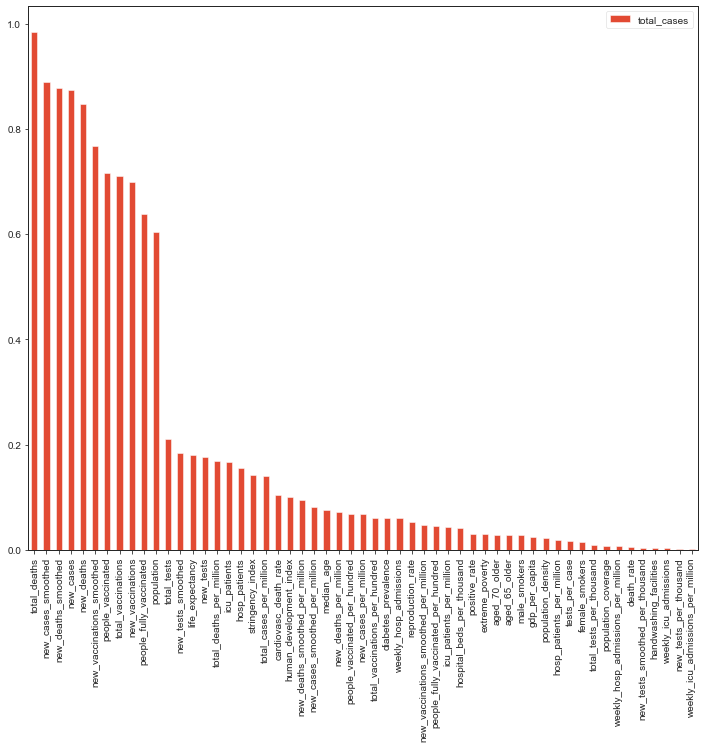

In [84]:
correlations = covid_df_copy.corr()['total_cases'].abs().sort_values(ascending=False).drop('total_cases',axis=0).to_frame()
correlations.plot(kind='bar',figsize=(12,10));

In [85]:
# Function to see the correlation of each features

def corr(df):
    "argument df tp get the correlation for"
    return df.corr()

In [86]:
corr(covid_df_copy).style.background_gradient(cmap="CMRmap_r")


<h1 style='background:#27A2AB; border:0; color:black'><center>Linear Regression-Forecast</center></h1> 

#### Created a Linear regression model and fit the model with owid COVID19 data, predicted the world death projection for the next 30 days. In this project I have used sklearn for creating Linear Regression model and created training split with 80 to 20%. The trained the model and predicted the death for next 30 days. Also created model using XGBoost for improving the linear regression model and fit the model with owid COVID19 data, predicted the world death projection for the next 30 days.

In [87]:
#owid_covid_data = pd.read_csv('https://raw.githubusercontent.com/owid/covid-19-data/master/public/data/owid-covid-data.csv')
#owid_covid_data.head()

In [88]:
#Select Coloumn to clean
ColumnToClean = ['total_cases', 'new_cases', 'total_deaths', 'new_deaths','aged_65_older','aged_70_older','gdp_per_capita','diabetes_prevalence','female_smokers','male_smokers','hospital_beds_per_thousand']
#Replace the nan with emty string
covid_df_copy[['location']] = covid_df_copy[['location']].fillna('')
#Replace the Nan with 0
covid_df_copy[ColumnToClean] = covid_df_copy[ColumnToClean].fillna(0)
#Filter the data so we will get only overall world data
covid_df_copy = covid_df_copy.query('location=="World"' )
Data_For_Regression = pd.DataFrame(columns=['date','total_cases', 'new_cases', 'total_deaths', 'new_deaths','aged_65_older','aged_70_older','gdp_per_capita','diabetes_prevalence','female_smokers','male_smokers','hospital_beds_per_thousand'], data=covid_df_copy[['date','total_cases', 'new_cases', 'total_deaths', 'new_deaths','aged_65_older','aged_70_older','gdp_per_capita','diabetes_prevalence','female_smokers','male_smokers','hospital_beds_per_thousand']].values)
Data_For_Regression.head()

,date,total_cases,new_cases,total_deaths,new_deaths,aged_65_older,aged_70_older,gdp_per_capita,diabetes_prevalence,female_smokers,male_smokers,hospital_beds_per_thousand
0,2020-01-22,557,0,17,0,8.696,5.355,15469.2,8.51,6.434,34.635,2.705
1,2020-01-23,655,98,18,1,8.696,5.355,15469.2,8.51,6.434,34.635,2.705
2,2020-01-24,941,286,26,8,8.696,5.355,15469.2,8.51,6.434,34.635,2.705
3,2020-01-25,1433,492,42,16,8.696,5.355,15469.2,8.51,6.434,34.635,2.705
4,2020-01-26,2118,685,56,14,8.696,5.355,15469.2,8.51,6.434,34.635,2.705


In [89]:
#set the index as date
Data_For_Regression['date'] = pd.to_datetime(Data_For_Regression['date'])
Data_For_Regression = Data_For_Regression.set_index('date')
Data_For_Regression.head()

,total_cases,new_cases,total_deaths,new_deaths,aged_65_older,aged_70_older,gdp_per_capita,diabetes_prevalence,female_smokers,male_smokers,hospital_beds_per_thousand
date,,,,,,,,,,,
2020-01-22,557,0,17,0,8.696,5.355,15469.2,8.51,6.434,34.635,2.705
2020-01-23,655,98,18,1,8.696,5.355,15469.2,8.51,6.434,34.635,2.705
2020-01-24,941,286,26,8,8.696,5.355,15469.2,8.51,6.434,34.635,2.705
2020-01-25,1433,492,42,16,8.696,5.355,15469.2,8.51,6.434,34.635,2.705
2020-01-26,2118,685,56,14,8.696,5.355,15469.2,8.51,6.434,34.635,2.705


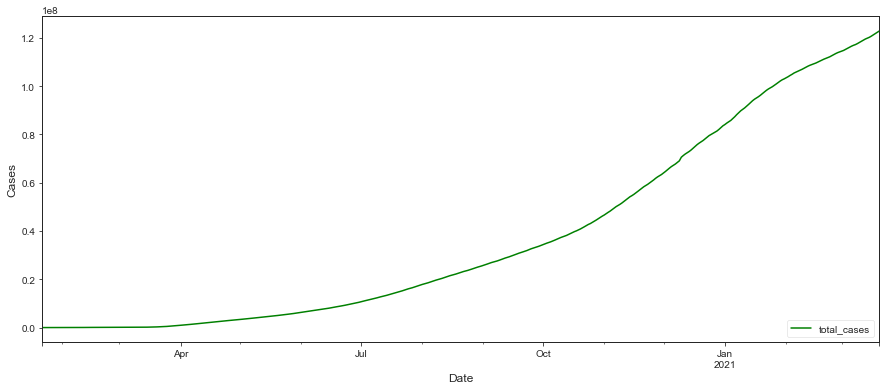

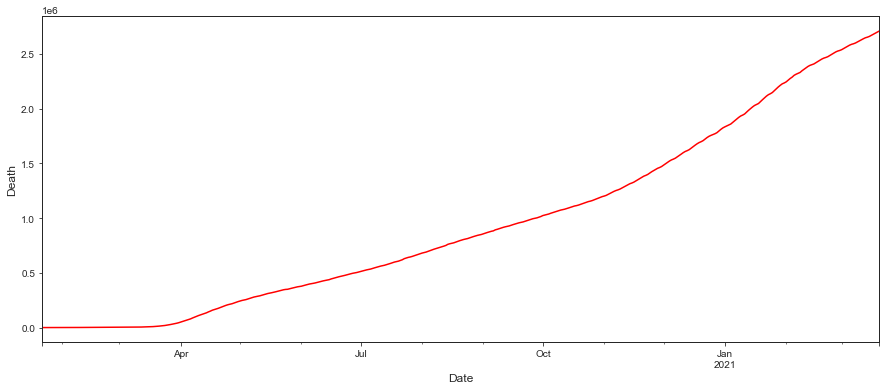

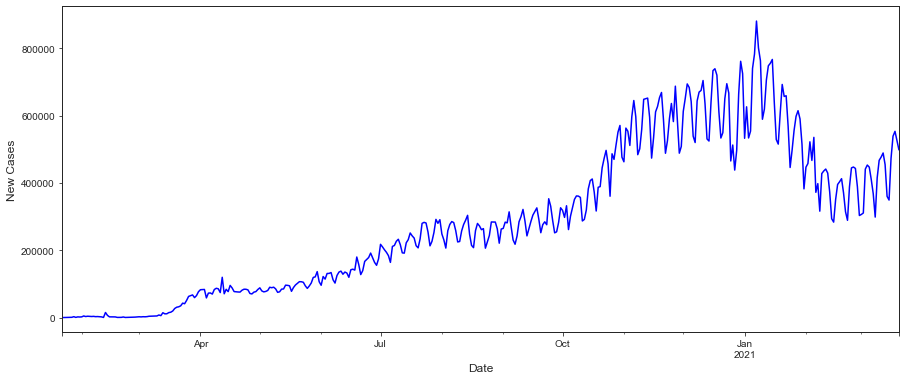

In [90]:
#Plot the graph
Data_For_Regression['total_cases'].plot(figsize=(15,6), color="green")
plt.legend(loc=4)
plt.xlabel('Date')
plt.ylabel('Cases')
plt.show()

Data_For_Regression['total_deaths'].plot(figsize=(15,6), color="red")
plt.xlabel('Date')
plt.ylabel('Death')
plt.show()

Data_For_Regression['new_cases'].plot(figsize=(15,6), color="blue")
plt.xlabel('Date')
plt.ylabel('New Cases')
plt.show()

In [91]:
# pick total death as forecast column
forecast_col = 'total_deaths'

# Chosing 30 days as number of forecast days
forecast_out = int(30)
print('length =',len(Data_For_Regression), "and forecast_out =", forecast_out)

length = 424 and forecast_out = 30


In [92]:
# Creating label by shifting 'total_deaths' according to 'forecast_out'
Data_For_Regression['temp'] = Data_For_Regression[forecast_col].shift(-forecast_out)
print(Data_For_Regression.head(2))
print('\n')
# verify rows with NAN in Label column 
print(Data_For_Regression.tail(2))

           total_cases new_cases total_deaths new_deaths aged_65_older  \
date                                                                     
2020-01-22         557         0           17          0         8.696   
2020-01-23         655        98           18          1         8.696   

           aged_70_older gdp_per_capita diabetes_prevalence female_smokers  \
date                                                                         
2020-01-22         5.355        15469.2                8.51          6.434   
2020-01-23         5.355        15469.2                8.51          6.434   

           male_smokers hospital_beds_per_thousand  temp  
date                                                      
2020-01-22       34.635                      2.705  2252  
2020-01-23       34.635                      2.705  2459  


            total_cases new_cases total_deaths new_deaths aged_65_older  \
date                                                                      
20

In [93]:
# Define features Matrix X by excluding the label column which we just created 
X = np.array(Data_For_Regression.drop(['temp'], 1))

# Using a feature in sklearn, preposessing to scale features
X = preprocessing.scale(X)
print(X[1,:])

[-0.96277535 -1.30745477 -1.17772698 -1.57016705  0.          0.
  0.          0.          0.          0.          0.        ]


In [94]:
# X contains last 'n= forecast_out' rows for which we don't have label data
# Put those rows in different Matrix X_forecast_out by X_forecast_out = X[end-forecast_out:end]

X_forecast_out = X[-forecast_out:]
X = X[:-forecast_out]
print ("Length of X_forecast_out:", len(X_forecast_out), "& Length of X :", len(X))

Length of X_forecast_out: 30 & Length of X : 394


In [95]:
# Define vector y for the data we have prediction for
# make sure length of X and y are identical
y = np.array(Data_For_Regression['temp'])
y = y[:-forecast_out]
print('Length of y: ',len(y))

Length of y:  394


In [96]:
# (split into test and train data)
# test_size = 0.2 ==> 20% data is test data
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=0)
print('length of X_train and x_test: ', len(X_train), len(X_test))

length of X_train and x_test:  315 79


In [97]:
# Create linear regression object
lr = LinearRegression()

# Train the model using the training sets
lr.fit(X_train, y_train)
# Test
accuracy = lr.score(X_test, y_test)
print("Accuracy of Linear Regression: ", accuracy)

Accuracy of Linear Regression:  0.9977341359065376


In [98]:
# Predict using our Model
forecast_prediction = lr.predict(X_forecast_out)
print(forecast_prediction)

[2761369.60822026 2742437.89032144 2716729.72549334 2723886.09683447
 2788747.50374794 2821086.80735987 2819915.21601815 2830601.30857385
 2810759.52283328 2776173.46813663 2795955.78519842 2827930.95955923
 2878011.83052154 2883045.16751441 2893069.35882272 2877604.12019003
 2855573.53005105 2854086.52866266 2915178.08026103 2937093.14712452
 2950239.62234392 2962518.40862667 2956578.76082901 2916684.33256088
 2929072.89997022 2992631.12646166 3021011.48961908 3038624.40664073
 3041431.8177346  3028397.38128222]


In [99]:
Data_For_Regression.tail()

,total_cases,new_cases,total_deaths,new_deaths,aged_65_older,aged_70_older,gdp_per_capita,diabetes_prevalence,female_smokers,male_smokers,hospital_beds_per_thousand,temp
date,,,,,,,,,,,,
2021-03-16,1.20697e+08,472966,2.67045e+06,9997,8.696,5.355,15469.2,8.51,6.434,34.635,2.705,NaN
2021-03-17,1.21236e+08,538804,2.68052e+06,10063,8.696,5.355,15469.2,8.51,6.434,34.635,2.705,NaN
2021-03-18,1.21789e+08,553312,2.69104e+06,10519,8.696,5.355,15469.2,8.51,6.434,34.635,2.705,NaN
2021-03-19,1.22316e+08,526273,2.70144e+06,10410,8.696,5.355,15469.2,8.51,6.434,34.635,2.705,NaN
2021-03-20,1.22814e+08,498140,2.70964e+06,8194,8.696,5.355,15469.2,8.51,6.434,34.635,2.705,NaN


In [100]:
last_date = Data_For_Regression.iloc[-1].name 
last_date

Timestamp('2021-03-20 00:00:00')

In [101]:
todays_date = datetime.strptime(last_date.strftime("%Y-%m-%d"), "%Y-%m-%d")
todays_date = todays_date + timedelta(days=1)
todays_date = datetime.strptime(todays_date.strftime("%Y-%m-%d"), "%Y-%m-%d")
index = pd.date_range(todays_date, periods=30, freq='D')
columns = ['total_cases', 'new_cases', 'total_deaths', 'new_deaths','aged_65_older','aged_70_older','gdp_per_capita','diabetes_prevalence','female_smokers','male_smokers','hospital_beds_per_thousand','temp','forecast']
temp_df = pd.DataFrame(index=index, columns=columns)
temp_df

,total_cases,new_cases,total_deaths,new_deaths,aged_65_older,aged_70_older,gdp_per_capita,diabetes_prevalence,female_smokers,male_smokers,hospital_beds_per_thousand,temp,forecast
2021-03-21,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2021-03-22,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2021-03-23,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2021-03-24,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2021-03-25,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2021-03-26,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2021-03-27,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2021-03-28,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2021-03-29,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2021-03-30,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [102]:
j=0
for i in forecast_prediction:
    temp_df.iat[j,12] = i
    j= j+1

temp_df

,total_cases,new_cases,total_deaths,new_deaths,aged_65_older,aged_70_older,gdp_per_capita,diabetes_prevalence,female_smokers,male_smokers,hospital_beds_per_thousand,temp,forecast
2021-03-21,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2.76137e+06
2021-03-22,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2.74244e+06
2021-03-23,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2.71673e+06
2021-03-24,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2.72389e+06
2021-03-25,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2.78875e+06
2021-03-26,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2.82109e+06
2021-03-27,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2.81992e+06
2021-03-28,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2.8306e+06
2021-03-29,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2.81076e+06
2021-03-30,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2.77617e+06


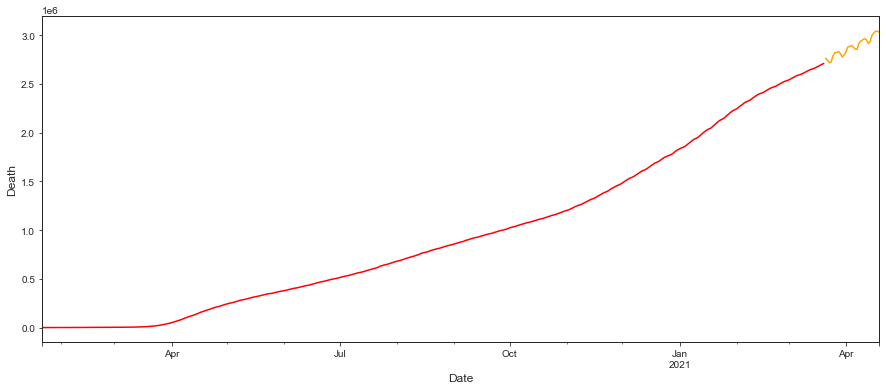

In [103]:
#Append the forcasted - Initially did it for easness but kater decided to use xgboost also
Data_For_Regression['total_deaths'].plot(figsize=(15,6), color="red")
temp_df['forecast'].plot(figsize=(15,6), color="orange")
plt.xlabel('Date')
plt.ylabel('Death')
plt.show()

In [104]:
#  XGboost algorithm to see if we can get better results
xgb_model = xgb.XGBRegressor(objective ='reg:squarederror',colsample_bytree=0.4,
                 gamma=0,                 
                 learning_rate=0.07,
                 max_depth=3,
                 min_child_weight=1.5,
                 n_estimators=10000,                                                                    
                 reg_alpha=0.75,
                 reg_lambda=0.45,
                 subsample=0.6) 

traindf, testdf = train_test_split(X_train, test_size = 0.2)

xgb_model.fit(X_train,y_train)

xgforecast_prediction = xgb_model.predict(X_forecast_out)

xgforecast_prediction

array([2704656.8, 2664913.5, 2536690.5, 2613490.5, 2718172.5, 2689632. ,
       2673268.8, 2692658.8, 2692065.8, 2523291.5, 2579734.8, 2612704.2,
       2710746.8, 2683083.2, 2674768.8, 2685463.5, 2556501.8, 2596244.8,
       2673547. , 2670320.2, 2676758.2, 2687230.2, 2673305.8, 2559467. ,
       2608374.2, 2668408.5, 2656320.8, 2672826.5, 2676134.5, 2675404.8],
      dtype=float32)

In [105]:
#Setting the temperory df with XGboost forecasted data
j=0
for i in xgforecast_prediction:
    temp_df.iat[j,12] = i
    j= j+1


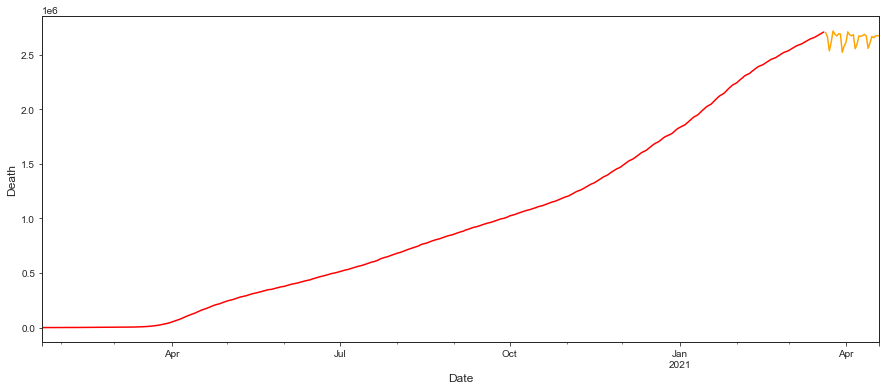

In [106]:
Data_For_Regression['total_deaths'].plot(figsize=(15,6), color="red")
temp_df['forecast'].plot(figsize=(15,6), color="orange")
plt.xlabel('Date')
plt.ylabel('Death')
plt.show()

<h1 style='background:#27A2AB; border:0; color:black'><center>k-nearest neighbors(KNN) algorithm </center></h1> 

### I will create a model that can predict the risk for the Case Mortality Ratio of a Country utilizing its Life Expectancy, Percentage of Population over 65, and Percentage of diabetes_prevalence and cardiovasc_death_rate ? 

It decided on using Population Over Age 65 and diabetes_prevalence cardiovasc_death_rate because in the world, over 80% of the deaths were in the population 65 and over, and the CDC has stated that 94% of deaths had some underlying health condition. We also used Life Expectancy per country to account for possible deficiencies in the health care system. John Hopkins University has listed several diseases such as heart disease and Diabetes which are known to be exacerbated by cardiovasc_death_rate and Obesity. Our idea is that we can more accurately predict the Mortality Ratio of COVID-19 by using both population 65 and over and Obesity rather than just population 65 and over. This may show that creating a healthier population is the best way to prevent the devastation in future pandemics that the world is currently facing

After viewing the graphs in Linear Regression-Forecast we the accuracy that XGboost algorithms can achieve with this data. . We will continue and see if our ML Algorithm can do better than we are expecting. We have initially chosen to use categorization with the HighRisk category as that may be more accurate than regression.
Or can we use more precise algorithms to build a data-appropriate learning model?

In [107]:
covid_df_copy = covid_df.copy()

In [108]:
covid_df_copy.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 76215 entries, 0 to 76214
Data columns (total 61 columns):
 #   Column                                 Non-Null Count  Dtype  
---  ------                                 --------------  -----  
 0   iso_code                               76215 non-null  object 
 1   continent                              72473 non-null  object 
 2   location                               76215 non-null  object 
 3   date                                   76215 non-null  object 
 4   total_cases                            76215 non-null  float64
 5   new_cases                              76215 non-null  float64
 6   new_cases_smoothed                     76215 non-null  float64
 7   total_deaths                           76215 non-null  float64
 8   new_deaths                             76215 non-null  float64
 9   new_deaths_smoothed                    76215 non-null  float64
 10  total_cases_per_million                76215 non-null  float64
 11  ne

In [109]:
#it decided to Create a column the High Risk and base it off of total_deaths_per_million which is the Total deaths attributed to COVID-19 per 1,000,000 people
covid_df_copy['HighRisk'] = zscore(covid_df_copy['total_deaths_per_million']) > 0.65

In [110]:
covid_df_copy.head(20)

,iso_code,continent,location,date,total_cases,new_cases,new_cases_smoothed,total_deaths,new_deaths,new_deaths_smoothed,...,diabetes_prevalence,female_smokers,male_smokers,handwashing_facilities,hospital_beds_per_thousand,life_expectancy,human_development_index,death_rate,population_coverage,HighRisk
0,AFG,Asia,Afghanistan,2020-02-24,1.0,1.0,0.000,0.0,0.0,0.0,...,9.59,0.0,0.0,37.746,0.5,64.83,0.511,NaN,0.0,False
1,AFG,Asia,Afghanistan,2020-02-25,1.0,0.0,0.000,0.0,0.0,0.0,...,9.59,0.0,0.0,37.746,0.5,64.83,0.511,NaN,0.0,False
2,AFG,Asia,Afghanistan,2020-02-26,1.0,0.0,0.000,0.0,0.0,0.0,...,9.59,0.0,0.0,37.746,0.5,64.83,0.511,NaN,0.0,False
3,AFG,Asia,Afghanistan,2020-02-27,1.0,0.0,0.000,0.0,0.0,0.0,...,9.59,0.0,0.0,37.746,0.5,64.83,0.511,NaN,0.0,False
4,AFG,Asia,Afghanistan,2020-02-28,1.0,0.0,0.000,0.0,0.0,0.0,...,9.59,0.0,0.0,37.746,0.5,64.83,0.511,NaN,0.0,False
5,AFG,Asia,Afghanistan,2020-02-29,1.0,0.0,0.143,0.0,0.0,0.0,...,9.59,0.0,0.0,37.746,0.5,64.83,0.511,0.0,0.0,False
6,AFG,Asia,Afghanistan,2020-03-01,1.0,0.0,0.143,0.0,0.0,0.0,...,9.59,0.0,0.0,37.746,0.5,64.83,0.511,0.0,0.0,False
7,AFG,Asia,Afghanistan,2020-03-02,1.0,0.0,0.000,0.0,0.0,0.0,...,9.59,0.0,0.0,37.746,0.5,64.83,0.511,NaN,0.0,False
8,AFG,Asia,Afghanistan,2020-03-03,2.0,1.0,0.143,0.0,0.0,0.0,...,9.59,0.0,0.0,37.746,0.5,64.83,0.511,0.0,0.0,False
9,AFG,Asia,Afghanistan,2020-03-04,4.0,2.0,0.429,0.0,0.0,0.0,...,9.59,0.0,0.0,37.746,0.5,64.83,0.511,0.0,0.0,False


### Correlation Analysis

#### We will be using the diabetes, cardiovascular health, percent of poplation above 70 and any other data we find to be the most useful to see if we can get better results with these  features.

In [111]:
corr = covid_df_copy[['death_rate', 'total_deaths_per_million', 'aged_65_older','extreme_poverty', 'icu_patients', 'life_expectancy', 'cardiovasc_death_rate', 'diabetes_prevalence', 'human_development_index', 'population_density', 'aged_70_older', 'population_coverage']].corr()
corr.style.background_gradient(cmap='coolwarm')
#Total deaths attributed to COVID-19 per 1,000,000 people
#With the new data the correlations seem stronger on aged_70_older, 'cardiovasc_death_rate', 'diabetes_prevalence', 'human_development_index', 'population_density', 'aged_70_older',and  'population_coverage' than before.

,death_rate,total_deaths_per_million,aged_65_older,extreme_poverty,icu_patients,life_expectancy,cardiovasc_death_rate,diabetes_prevalence,human_development_index,population_density,aged_70_older,population_coverage
death_rate,1.000000,0.011712,0.019838,-0.004740,0.002655,0.001072,0.007339,-0.016454,-0.005875,0.000378,0.022357,-0.027813
total_deaths_per_million,0.011712,1.000000,0.261580,-0.190581,0.209748,0.087003,-0.210793,-0.044598,0.131226,-0.024086,0.264115,0.284074
aged_65_older,0.019838,0.261580,1.000000,-0.314490,0.152195,0.495638,-0.061668,0.077630,0.690167,-0.038343,0.965808,0.233574
extreme_poverty,-0.004740,-0.190581,-0.314490,1.000000,-0.042952,-0.145519,0.191294,-0.273647,-0.253455,-0.055936,-0.315749,-0.129305
icu_patients,0.002655,0.209748,0.152195,-0.042952,1.000000,0.062059,-0.068656,0.025804,0.101677,-0.012730,0.154094,0.124600
life_expectancy,0.001072,0.087003,0.495638,-0.145519,0.062059,1.000000,0.170786,0.436338,0.751472,0.123856,0.485926,0.167732
cardiovasc_death_rate,0.007339,-0.210793,-0.061668,0.191294,-0.068656,0.170786,1.000000,0.244890,0.152652,-0.179121,-0.098685,-0.098590
diabetes_prevalence,-0.016454,-0.044598,0.077630,-0.273647,0.025804,0.436338,0.244890,1.000000,0.461805,0.026118,0.018650,0.075327
human_development_index,-0.005875,0.131226,0.690167,-0.253455,0.101677,0.751472,0.152652,0.461805,1.000000,-0.128936,0.638597,0.249810
population_density,0.000378,-0.024086,-0.038343,-0.055936,-0.012730,0.123856,-0.179121,0.026118,-0.128936,1.000000,-0.047520,0.002514



### Now we will split our data for the Machine Learning Algorithm using the High Risk Category as our target and Life_Expectancy,icu_patients ,diabetes_prevalence, and aged_65_older as features

In [112]:

predictors = ['diabetes_prevalence','icu_patients','life_expectancy', 'cardiovasc_death_rate', 'human_development_index', 'aged_70_older', 'population_density', 'female_smokers', 'male_smokers', 'extreme_poverty']
target = 'HighRisk'
X = covid_df_copy[predictors].values
y = covid_df_copy[target].values

# Split the data into training and test sets, and scale
scaler = StandardScaler()

# unscaled version (note that scaling is only used on predictor variables)
X_train_raw, X_test_raw, y_train, y_test = train_test_split(X, y, test_size=0.30, random_state=42)

# scaled version
X_train = scaler.fit_transform(X_train_raw)
X_test = scaler.transform(X_test_raw)
print('First 10 Rows of Scaled Data: \n\n', X_train[0:10:,], '\n')

knn = KNeighborsClassifier()
knn.fit(X_train, y_train)
predictions = knn.predict(X_test)
accuracy = (predictions == y_test).mean()
print('Accuracy:', round(accuracy * 100, 2), '%')

First 10 Rows of Scaled Data: 

 [[ 2.16970375e+00 -9.92836241e-02  4.45157032e-01 -6.32460446e-01
   7.48536558e-01 -8.31170980e-01  1.00417221e+00 -1.78831296e-01
   7.75762571e-01 -4.86384094e-01]
 [ 2.22119711e+00 -9.92836241e-02  3.80613143e-01  1.84617450e-01
   5.78461190e-01 -3.67873461e-01 -1.38292306e-01 -6.58327027e-01
   1.03379387e+00 -4.80475136e-01]
 [ 1.23814206e+00 -9.92836241e-02  1.24722329e-01  1.64963247e-01
   2.86903415e-01 -1.79343481e-01 -1.95825003e-01 -1.89993855e-02
   1.06067213e+00 -4.86384094e-01]
 [-1.46525932e+00 -9.92836241e-02 -4.41321860e-01 -3.05476685e-03
  -4.94633396e-01 -7.03878840e-01 -1.36518668e-01 -6.98285004e-01
  -5.84277375e-01  2.44445898e+00]
 [-7.49386104e-02 -9.92836241e-02  4.80570493e-01 -5.65009433e-01
   6.06807084e-01  1.22706265e+00 -1.85802333e-01  6.40307245e-01
  -1.75727826e-01 -4.80475136e-01]
 [ 5.44889451e+00 -9.92836241e-02  2.40101670e-01  2.40469736e+00
   1.49223355e-01 -1.14928665e+00 -1.47735658e-02 -7.58221971e-01


### It looks like despite our initial reservations that KNN was able to get a decent accuracy of 90.14 %
#### Let's test which k value gets us our best accuracy.

In [113]:
n = 8
accuracies = []
ks = np.arange(1, n+1, 2)
for k in ks:
    print(k, ' ', end='')
    knn = KNeighborsClassifier(n_neighbors=k)
    knn.fit(X_train, y_train)
    predictions = knn.predict(X_test)
    acc = (predictions == y_test).mean()
    accuracies.append(acc)
print('done')

def get_best(ks, accuracies):
    maximum = np.array(accuracies).max()
    indexMax = np.where(accuracies == maximum)
    return ks[indexMax], maximum

best_k, best_acc = get_best(ks, accuracies)
print('best k = {}, best accuracy: {:0.3f}%'.format(best_k, best_acc * 100))


1  3  5  7  done
best k = [7], best accuracy: 90.518%


#### Interestingly a slightly better classification of  90.226% with k =7.

In [114]:
print('Comparison of predictions to y_test values: \n\n', predictions == y_test)
print('\nPredictions:\n\n', predictions)
print('\nY_test values:\n\n', y_test)

Comparison of predictions to y_test values: 

 [ True  True  True ...  True  True  True]

Predictions:

 [ True False False ... False False False]

Y_test values:

 [ True False False ... False False False]


A further look at our predictions and Y_test values show that we get 90.226% simply by predicting almost everything as False so this model's features and data should be improved

##### Now we will try to test all the features we currently have and select through a greedy algorithm the best features utilizing KNN and all K-Ranges between 1 and 7

In [115]:
predictors = ['diabetes_prevalence','icu_patients','life_expectancy', 'cardiovasc_death_rate','human_development_index', 'aged_70_older', 'population_density', 'female_smokers', 'male_smokers', 'extreme_poverty']
target = 'HighRisk'
X = covid_df_copy[predictors].values
y = covid_df_copy[target].values
# Split the data into training and test sets, and scale
scaler = StandardScaler()

# unscaled version (note that scaling is only used on predictor variables)
X_train_raw, X_test_raw, y_train, y_test = train_test_split(X, y, test_size=0.30, random_state=42)

# scaled version
X_train = scaler.fit_transform(X_train_raw)
X_test = scaler.transform(X_test_raw)

ks = np.arange(1, 8, 2)
for k in ks:
    best_acc = 0
    selected = []
    remaining = list(range(X_train.shape[1]))
    n = 11
    better = True
    while len(selected) < n and better == True:
        # find the single features that works best in conjunction
        # with the already selected features
        acc_max = 0
        for i in remaining:
            # make a version of the training data with just selected, feature i
            selectedFi = selected.copy()
            selectedFi.append(i)
            X_si = X_train[:,selectedFi]
            y_siTrain = y_train[~np.isnan(X_si).any(axis=1)]
            X_si=X_si[~np.isnan(X_si).any(axis=1)]
            knn = KNeighborsClassifier(n_neighbors=k)
            knn.fit(X_si, y_siTrain)
            X_testSi = X_test[:,selectedFi]
            y_siTest = y_test[~np.isnan(X_testSi).any(axis=1)]
            X_testSi = X_testSi[~np.isnan(X_testSi).any(axis=1)]
            predictions = knn.predict(X_testSi)

            acc = (predictions == y_siTest).mean()
            if (acc > acc_max):
                acc_max = acc
                i_min = i
                if (best_acc < acc):
                    best_acc = acc
                    better = True
                else:
                    better = False


        if (better == True):        
            remaining.remove(i_min)
            selected.append(i_min)
            print('k: {}; num features: {}; features: {}; bestAcc: {:.2f}%'.format(k, len(selected), [predictors[x] for x in selected], best_acc*100))
    

k: 1; num features: 1; features: ['icu_patients']; bestAcc: 86.57%
k: 1; num features: 2; features: ['icu_patients', 'male_smokers']; bestAcc: 87.74%
k: 1; num features: 3; features: ['icu_patients', 'male_smokers', 'extreme_poverty']; bestAcc: 88.32%
k: 1; num features: 4; features: ['icu_patients', 'male_smokers', 'extreme_poverty', 'life_expectancy']; bestAcc: 88.42%
k: 1; num features: 5; features: ['icu_patients', 'male_smokers', 'extreme_poverty', 'life_expectancy', 'aged_70_older']; bestAcc: 88.46%
k: 3; num features: 1; features: ['icu_patients']; bestAcc: 86.88%
k: 3; num features: 2; features: ['icu_patients', 'life_expectancy']; bestAcc: 89.28%
k: 3; num features: 3; features: ['icu_patients', 'life_expectancy', 'female_smokers']; bestAcc: 89.80%
k: 3; num features: 4; features: ['icu_patients', 'life_expectancy', 'female_smokers', 'human_development_index']; bestAcc: 89.83%
k: 3; num features: 5; features: ['icu_patients', 'life_expectancy', 'female_smokers', 'human_develop

### Looking at the data above we have gotten a bit better accuracy using k=7 with the following 4 features:
population_density', 'icu_patients', 'female_smokers', 'human_development_index'

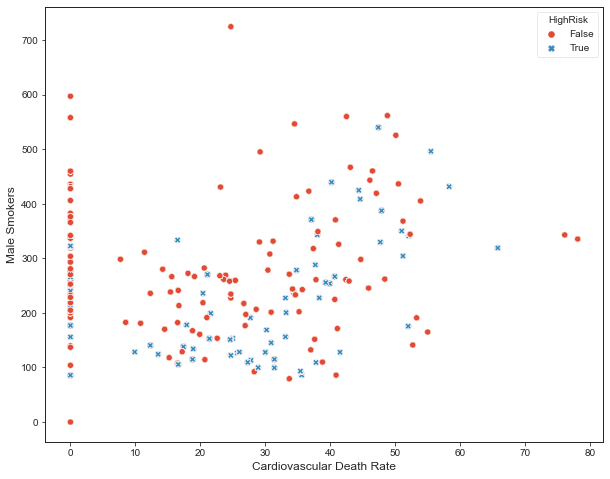

In [116]:
# change default plot size
rcParams['figure.figsize'] = 10,8
sns.scatterplot(data=covid_df_copy, x='male_smokers', y='cardiovasc_death_rate', hue='HighRisk', style='HighRisk');
plt.xlabel("Cardiovascular Death Rate")
plt.ylabel("Male Smokers");

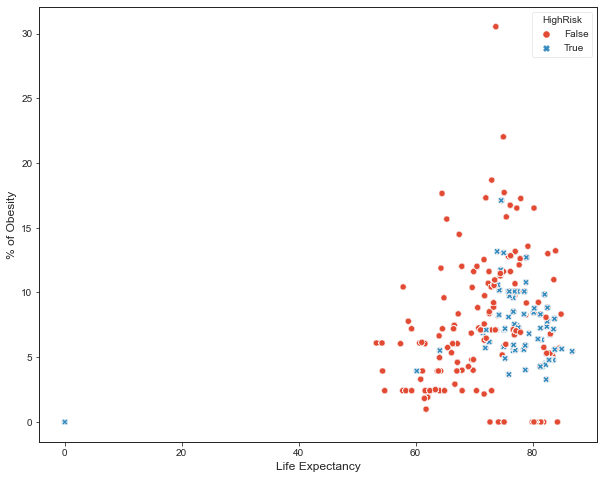

In [117]:
sns.scatterplot(data=covid_df_copy, x='life_expectancy', y='diabetes_prevalence', hue='HighRisk', style='HighRisk')
plt.xlabel("Life Expectancy")
plt.ylabel("% of Obesity");

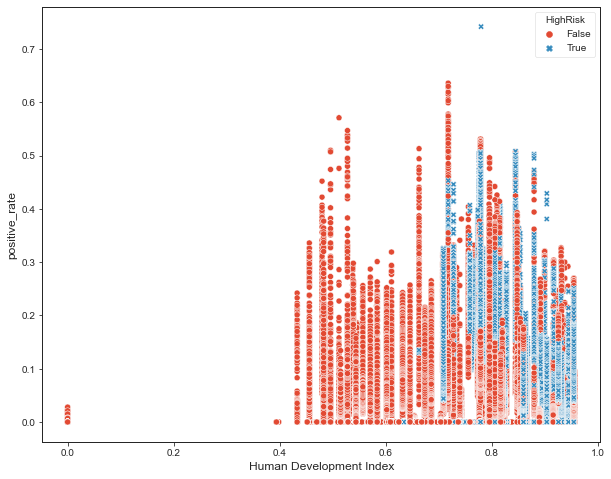

In [118]:
sns.scatterplot(data=covid_df_copy, x='human_development_index', y='positive_rate', hue='HighRisk', style='HighRisk');
plt.xlabel("Human Development Index")
plt.ylabel("positive_rate");

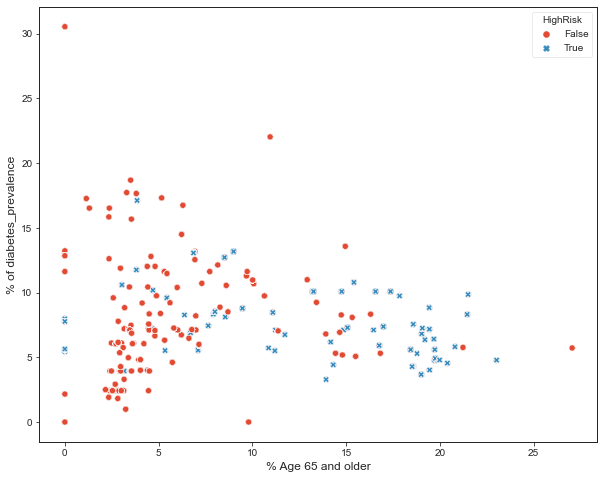

In [119]:
sns.scatterplot(data=covid_df_copy, x='aged_65_older', y='diabetes_prevalence', hue='HighRisk', style='HighRisk');
plt.xlabel("% Age 65 and older")
plt.ylabel("% of diabetes_prevalence");

In [120]:
k = 7
predictors = ['diabetes_prevalence','icu_patients','female_smokers','male_smokers', 'human_development_index', 'life_expectancy','cardiovasc_death_rate','positive_rate']
target = 'HighRisk'

# unscaled version (note that scaling is only used on predictor variables)
X = covid_df_copy[predictors].values
y = covid_df_copy[target].values

# Split the data into training and test sets, and scale
scaler = StandardScaler()

X_train_raw, X_test_raw, y_train, y_test = train_test_split(X, y, test_size=0.30, random_state=42)
# scaled version
X_train = scaler.fit_transform(X_train_raw)
X_test = scaler.transform(X_test_raw)

#Remove data rows with nan
y_train = y_train[~np.isnan(X_train).any(axis=1)]
X_train = X_train[~np.isnan(X_train).any(axis=1)]

y_test = y_test[~np.isnan(X_test).any(axis=1)]
X_test = X_test[~np.isnan(X_test).any(axis=1)]

knn = KNeighborsClassifier(n_neighbors=k)
knn.fit(X_train, y_train)
predictions = knn.predict(X_test)

acc = (predictions == y_test).mean()

print('Comparison of predictions to y_test values: \n\n', predictions == y_test)
print('\nPredictions:\n\n', predictions)
print('\nY_test values:\n\n', y_test)

print('\nAccurancy: ', acc)

Comparison of predictions to y_test values: 

 [ True  True  True ...  True  True  True]

Predictions:

 [ True False False ... False False False]

Y_test values:

 [ True False False ... False False False]

Accurancy:  0.937109118740433


#### The model using the extra features especially the human_development_index, smoker data and more recent target data has gotten better at predicting a countries rate of mortality vs population going from 90% to 93% accuracy depending on the randomization.

##### This may be due to different reporting systems for what is and is not a covid death and overall accuracy of the inputs.

#### Our original Hypotheses that Age and Obesity would be factors seem to have been proven true through the data, one might even be able to try regression on the normalized mortality / population and if we had the One World Data originally we may have even gone further and tried that as the correlation seems to be stronger

## Inferences and Conclusion

- The United States and India are more affected by Covid 19, and the number of injuries and deaths is very high. Nevertheless, the  United States  first in the world to be vaccinated from the Corona vaccine

- Recommendation Assuming the published data are reliable, the SIR model (1) can be applied to assess the spread of the COVID-19 disease and predict the number of infected, removed and recovered populations and deaths in the communities, accommodating at the same time possible surges in the number of susceptible individuals

Two questions guide this daily updated publication on the global COVID-19 pandemic:

How can we make progress against the pandemic?
And, are we making progress?
To answer these questions we need data. But data is not enough. This is especially true in this pandemic because even the best available data is far from perfect. Much of our work therefore focuses on explaining what the data can – and can not – tell us about the pandemic. 

Our goal is two-fold:

To provide reliable, global and open data and research on how the COVID-19 pandemic is spreading, what impact the pandemic has, how we can make progress against the pandemic, and whether the measures countries are taking are successful or not;
And to build an infrastructure that allows research colleagues – and everyone who is interested – to navigate and understand this data and research.
Before we study how to make progress we should consider the more basic question: is it possible to do so?

The answer is very clear: While some countries have failed in their response to the pandemic, others met the challenge much more successfully. Perhaps the most important thing to know about the pandemic is that it is possible to fight the pandemic.

Responding successfully means two things: limiting the direct and the indirect impact of the pandemic. Countries that have responded most successfully were able to avoid choosing between the two: they avoided the trade-off between a high mortality and a high socio-economic impact of the pandemic. New Zealand has been able to bring infections down and open up their country internally. Other island nations were also able to almost entirely prevent an outbreak (like Taiwan, Australia, and Iceland). But not only islands were able to bend the curve of infections and prevent large outbreaks – Norway, Uruguay, Switzerland, South Korea, and Germany are examples. These countries suffered a smaller direct impact, but they also limited the indirect impacts because they were able to release lockdown measures earlier.

Together with colleagues at the Robert Koch Institute, the Chan School of Public Health, the UK Public Health Rapid Support Team, the London School of Hygiene and Tropical Medicine and other institutions we study countries that responded most successfully in detail.

Among the countries with the highest death toll are some of the most populous countries in the world such as the US, Brazil, and Mexico. If you prefer to adjust for the differences in population size you can switch to per capita statistics by clicking the ‘per million people’ tickbox.

We can see three different ways in which the pandemic has affected countries:

- Some countries have not been able to contain the pandemic. The death toll there continues to rise quickly week after week.
- Some countries saw large outbreaks, but then ‘bent the curve’ and brought the number of deaths down again. Italy, Germany, and many European countries followed this trajectory.
- Some were able to prevent a large outbreak altogether. Shown in the chart are South Korea and Norway. These countries had rapid outbreaks, but were then able to reduce the number of deaths very quickly to low numbers.

While some commentaries on the pandemic have the premise that all countries failed to respond well to the pandemic the exact opposite stands out to us: Even at this early stage of the pandemic we see very large differences between countries – as the chart shows. While some suffer terrible outbreaks others have managed to contain rapid outbreaks or even prevented bad outbreaks entirely. It is possible to respond successfully to the pandemic.

- Some countries, like Australia, South Korea and Slovenia do hundreds, or even thousands of tests for each case they find – the positive rate of these countries is therefore below 1% or even 0.1%.
- Others, such as Mexico, Nigeria, and Bangladesh do very few tests – five or fewer – for every confirmed case. Their positive rate is very high.

- The data for Slovakia, Thailand, New Zealand, South Korea, and Germany shows that these countries monitored the outbreak well from the start or caught up rapidly after an initial outbreak. Eventually they were able to bend the curve and bring down the number of confirmed cases, while increasing the ratio of tests to confirmed cases. These are not the only countries that achieved this; you can add for example Austria, Iceland, Slovenia, Tunisia, or Latvia to the chart and you will find similar trajectories.
- The data for Brazil, Mexico, the United States, Panama, India, Pakistan, South Africa, and Nigeria shows that these countries test little relative to the size of the outbreak. Additionally these countries report unfortunately still very high daily case counts – their lines are red and far from zero.

Fighting the pandemic: What can everyone of us do to flatten the curve?
Some measures against the pandemic are beyond what any individual can do. The development of a vaccine, R&D in pharmaceutical research, building the infrastructure to allow large-scale testing, and coordinated policy responses require large-scale collaboration and are society-wide efforts. We will explore these later.

But, as with all big problems, there are many ways to make progress and some of the most important measures are up to all of us.

In the fight against the pandemic we are in the fortunate situation that what is good for ourselves is also good for everyone else. By protecting yourself you are slowing the spread of the pandemic.

You and everyone else have the same two clear personal goals during this pandemic: Don’t get infected and don’t infect others.

To not get infected you have to do what you can to prevent the virus from entering your body through your mouth, nose, or eyes. To not infect others your goal is to prevent the virus from traveling from your body to the mouth, nose or eyes of somebody else.

What can you do? How can all of us – you and me – do our part to flatten the curve? The three main measures are called the three Ws: Wash your hands, wear a mask, watch your distance.

## References and Future Work
    
1- https://www.geeksforgeeks.org/python-programming-language/?ref=leftbar

2- https://www.python-course.eu/python3_class_and_instance_attributes.php

3- https://thispointer.com/data-analysis-in-python-using-pandas/

4- https://jovian.ml/learn/data-analysis-with-python-zero-to-pandas

5- https://ourworldindata.org/coronavirus

6- https://covid19.moh.gov.sa/

7-https://github.com/

8-https://www.kaggle.com/